# Prepare the environment

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

drive_dir_path = "/content/drive/MyDrive/colab/picture_embedding"
! mkdir -p {drive_dir_path}
import os
cwd = os.getcwd() 
data_dir = os.path.join(drive_dir_path, 'data')
root = os.path.join(data_dir, 'val2017')
annFile = os.path.join(data_dir, 'annotations', 'instances_val2017.json')

Mounted at /content/drive


In [ ]:
from google.colab.output import eval_js
def shrink(height="300"):
    eval_js(f'google.colab.output.setIframeHeight({height})')

In [ ]:
! pip install --upgrade pip
! pip install torch torchvision torchsummary gca pandas numpy matplotlib seaborn scikit-learn==0.23.2 pycocotools tqdm umap-learn kneed
! pip install git+https://github.com/waleedka/cocoapi.git#egg=pycocotools&subdirectory=PythonAPI
# TODO: install the docem python package via github
! pip list
shrink()

     |████████████████████████████████| 1.5MB 6.2MB/s 
  Found existing installation: pip 19.3.1
    Uninstalling pip-19.3.1:
      Successfully uninstalled pip-19.3.1
     |████████████████████████████████| 6.8 MB 6.5 MB/s 
  Created wheel for gca: filename=gca-0.1-py3-none-any.whl size=12303 sha256=06ed99a16c88bf08fd3f4d7a86d6ac31f7fd85f9dd1ba8809fa960fdae22cb50
  Stored in directory: /root/.cache/pip/wheels/ff/08/3c/7de2cc4ddb2c8130d349a43fe638754337edead3c10c38186b
Successfully built gca
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.22.2.post1
    Uninstalling scikit-learn-0.22.2.post1:
      Successfully uninstalled scikit-learn-0.22.2.post1
  Cloning https://github.com/waleedka/cocoapi.git to /tmp/pip-install-m6mn4h74/pycocotools_a382b43c9a7741168794093e0241535d
ERROR: Command errored out with exit status 128: git clone -q https://github.com/waleedka/cocoapi.git /tmp/pip-install-m6mn4h74/pycocotools_a382b43c9a7741168794093e0241535d Check the

Choose a GPU runtime

In [ ]:
import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    print(torch.cuda.current_device())
    print(torch.cuda.device_count())
    print(torch.cuda.get_device_name(0))
    
device

device(type='cpu')

# Load the ResNext-WSL model

In [ ]:
# Load the ResNext-WSL model

# small size model
model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x8d_wsl')
# medium size
# model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x16d_wsl')
# large size
# model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x32d_wsl')
# very large
# model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x48d_wsl')
# model.eval()

Downloading: "https://github.com/facebookresearch/WSL-Images/archive/master.zip" to /root/.cache/torch/hub/master.zip
Downloading: "https://download.pytorch.org/models/ig_resnext101_32x8-c38310e5.pth" to /root/.cache/torch/hub/checkpoints/ig_resnext101_32x8-c38310e5.pth


In [ ]:
from torch import nn
from torchsummary import summary

# Dropping output layer (the ImageNet classifier)

def slice_model(original_model, from_layer=None, to_layer=None):
    return nn.Sequential(*list(original_model.children())[from_layer:to_layer])
model_conv_features = slice_model(model, to_layer=-1).to(device)
summary(model_conv_features, input_size=(3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5          [-1, 256, 56, 56]          16,384
       BatchNorm2d-6          [-1, 256, 56, 56]             512
              ReLU-7          [-1, 256, 56, 56]               0
            Conv2d-8          [-1, 256, 56, 56]          18,432
       BatchNorm2d-9          [-1, 256, 56, 56]             512
             ReLU-10          [-1, 256, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          65,536
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
# Test the model works with a sample dog picture
import urllib
url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg", "dog.jpg")
try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)

from PIL import Image
input_image = Image.open(filename)
input_image

In [ ]:
from PIL import Image
from torchvision import transforms
# pre-processing required by ResNext
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


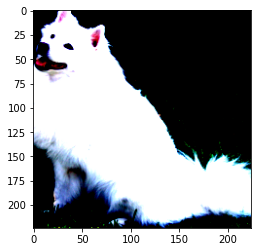

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
# Plotting the preprocessed picture to be usable by the model
# the range of values now fall outside the [0..1] RGB valid range
plt.imshow(np.moveaxis(input_tensor.numpy(), 0, -1 ))
plt.show()

shape torch.Size([1, 2048])


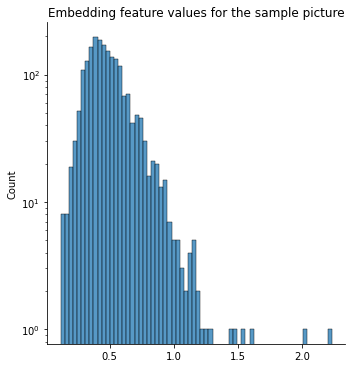

In [ ]:
input_batch = torch.stack([input_tensor])

input_batch = input_batch.to(device)

# applying the model to the pre-processed picture and extracting the 2048 ResNext features
with torch.no_grad():
    output = model_conv_features(input_batch).flatten(start_dim=1)
print('shape', output.shape)

import seaborn as sns
sns.displot(output[0].cpu().numpy())
# plt.xscale('log')
plt.yscale('log')
plt.title('Embedding feature values for the sample picture')
plt.show()

# Load COCO dataset

## Download the COCO 2017 validation and annotations

In [ ]:
# Only do this the first time
! wget http://images.cocodataset.org/zips/val2017.zip
! wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
! mkdir -p {drive_dir_path}/data

! unzip -q val2017.zip -d {drive_dir_path}/data
! unzip -q annotations_trainval2017.zip -d {drive_dir_path}/data

## Load using the PyCOCO library

In [ ]:
# Load the taxonomy of categories
import pycocotools
from pycocotools.coco import COCO

data_type='val2017'
ann_file='{}/annotations/instances_{}.json'.format(data_dir,data_type)
coco=COCO(ann_file)

cats = coco.loadCats(coco.getCatIds())

category_names =[cat['name'] for cat in cats]
print('COCO categories {}: \n{}\n'.format(len(category_names), ' '.join(category_names)))
supercategory_names = set([cat['supercategory'] for cat in cats])
print('COCO supercategories {}: \n{}'.format(len(supercategory_names), ' '.join(supercategory_names)))

category_taxonomy = {cat['name']: cat['supercategory'] for cat in cats}

loading annotations into memory...
Done (t=1.49s)
creating index...
index created!
COCO categories 80: 
person bicycle car motorcycle airplane bus train truck boat traffic light fire hydrant stop sign parking meter bench bird cat dog horse sheep cow elephant bear zebra giraffe backpack umbrella handbag tie suitcase frisbee skis snowboard sports ball kite baseball bat baseball glove skateboard surfboard tennis racket bottle wine glass cup fork knife spoon bowl banana apple sandwich orange broccoli carrot hot dog pizza donut cake chair couch potted plant bed dining table toilet tv laptop mouse remote keyboard cell phone microwave oven toaster sink refrigerator book clock vase scissors teddy bear hair drier toothbrush

COCO supercategories 12: 
animal sports food furniture kitchen appliance indoor outdoor accessory person vehicle electronic


In [ ]:
cat_id_to_name_dict = {cat['id']: cat['name'] for cat in cats}
cat_id_to_supercategory_name = {cat['id']: cat['supercategory'] for cat in cats}

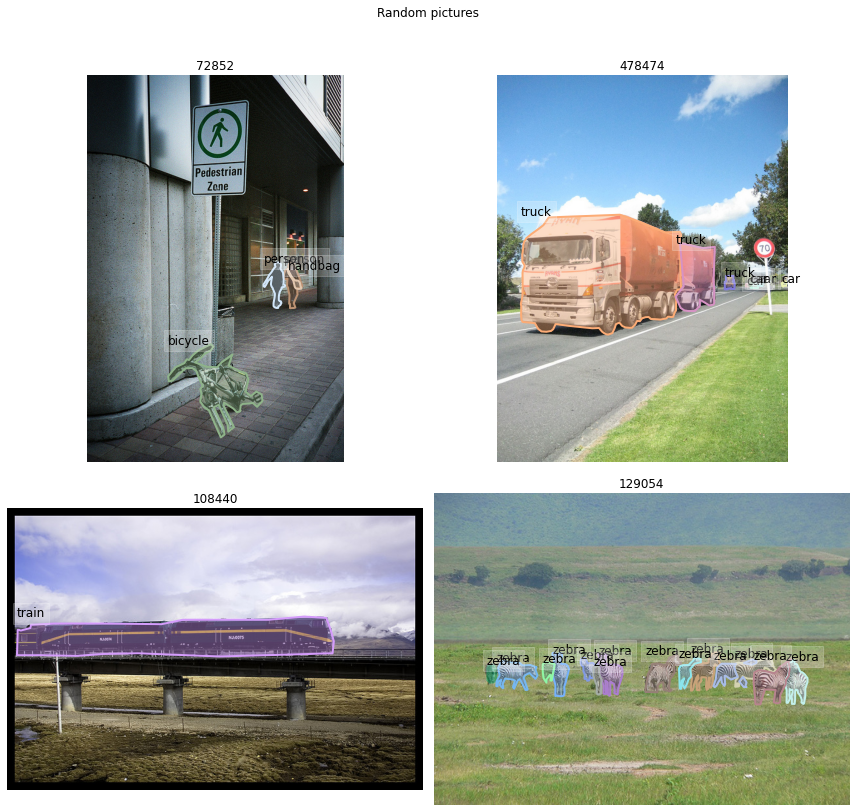

In [ ]:
# load and display instance annotations

import skimage.io as io
import matplotlib.pyplot as plt
import pylab
import numpy as np
import itertools

def plot_coco_images(img_ids, show_labels=True,
                     show_annotations=False, title_suffix=None, figtitle=None):
    nrows = len(img_ids)
    ncols = len(img_ids[0])

    fig = plt.figure(figsize=(ncols*6, nrows*6))

    for i, img_id in enumerate(itertools.chain(*img_ids)):
        ax = fig.add_subplot(nrows, ncols, i+1)
        img = coco.loadImgs(img_id)[0]
        I = io.imread(img['coco_url'])

        ax.imshow(I, aspect='equal', )
        ax.axis('off')
        
        if title_suffix is not None:
            title=f'{img_id}: {title_suffix[i//nrows, i%ncols]}'
        else:
            title = str(img_id)
        ax.set_title(title)

    
        annIds = coco.getAnnIds(imgIds=img['id'], iscrowd=None)
        anns = coco.loadAnns(annIds)
        if show_annotations:
            coco.showAnns(anns)

        if show_labels:
            for ann in anns:
                [x, y, _, _] = ann['bbox']
                label = cat_id_to_name_dict[ann['category_id']]

                t=ax.annotate(label, (x,y), fontsize=12)
                t.set_bbox(dict(facecolor='white', alpha=0.2, edgecolor='white'))

    plt.tight_layout()
    
    if figtitle:
        fig.suptitle(figtitle)
        plt.subplots_adjust(top=0.90)
    plt.show()

plot_coco_images([[72852, 478474], [108440, 129054]], 
                 figtitle='Random pictures', show_annotations=True)

## Load using the [torchvision API](https://pytorch.org/docs/stable/torchvision/datasets.html)

In [ ]:
import torchvision.datasets as dset

# torch datasets API
coco_val = dset.CocoDetection(root = root,
                              annFile = annFile, transform = preprocess)

# 5000 pictures with associated labels
len(coco_val)

loading annotations into memory...
Done (t=0.78s)
creating index...
index created!


5000

In [ ]:
from torch.utils.data import DataLoader
import multiprocessing

cpu_count = multiprocessing.cpu_count()
print('cpus', cpu_count)
batch_size = 64

data_loader = torch.utils.data.DataLoader(dataset=coco_val, 
                                          batch_size=batch_size,
                                          shuffle=False,
                                          num_workers=cpu_count,
                                          collate_fn=lambda x: x)

cpus 2


# Feature extraction

In [ ]:
from tqdm import tqdm
features_list = []
labels_list = []

# Use GPUs to speed up the inference, this should take around 10 minutes

model_conv_features.to(device)
for batch in tqdm(data_loader):
    image_batch, label_batch = [x[0] for x in batch], [x[1] for x in batch]
    image_batch = torch.stack(image_batch).to(device) 

    with torch.no_grad():
        features_batch = model_conv_features(image_batch).flatten(start_dim=1)
    features_list.append(features_batch)
    labels_list.extend(label_batch)
        
        

100%|██████████| 79/79 [10:13<00:00,  7.77s/it]


In [ ]:
import os
# concat features
features = torch.cat(features_list)
features.shape

In [ ]:
import torch
# Load pre-calculated features and labels
# torch.save(features, os.path.join(data_dir, "features_val.pt"))
features=torch.load(os.path.join(data_dir, "features_val.pt"), map_location=torch.device('cpu'))
import numpy as np
X = features.to("cpu").numpy()

import pickle
# pickle.dump(labels_list, open(os.path.join(data_dir, 'labels_list.pickle'), 'wb'))
labels_list=pickle.load(open(os.path.join(data_dir, 'labels_list.pickle'), 'rb'))

In [ ]:
# extract and concat labels, None in case of multiple labels
from collections import Counter
category_labels=[]
category_multi_labels = []
category_multi_labels_counts = []
supercategory_labels = []
supercategory_multi_labels = []
supercategory_multi_labels_counts = []
image_ids = []


cats_dict = {cat['id']: cat for cat in cats}
for label in labels_list:
    
    if len(label) > 0:
        categories = []
        supercategories = []
        
        for annotation in label:
            categories.append(cats_dict[annotation['category_id']]['name'])
            supercategories.append(cats_dict[annotation['category_id']]['supercategory'])
        category_multi_labels_counts.append(categories)
        category_multi_labels.append(list(set(categories)))
        supercategory_multi_labels.append(list(set(supercategories)))
        supercategory_multi_labels_counts.append(supercategories)

        # most common category among objects in the picture
        category, _ = Counter(categories).most_common(1)[0]
        supercategory, _ = Counter(supercategories).most_common(1)[0]
        
        image_ids.append(label[0]['image_id'])
        category_labels.append(category)
        supercategory_labels.append(supercategory)
    else:
        supercategory_multi_labels.append([])
        supercategory_multi_labels_counts.append([])
        category_multi_labels.append([])
        category_multi_labels_counts.append([])
        category_labels.append(None)
        supercategory_labels.append(None)
        image_ids.append(None)
        
len(category_labels), len(supercategory_labels), len(image_ids), len(supercategory_multi_labels), len(category_multi_labels), len(supercategory_multi_labels_counts), len(category_multi_labels_counts)

(5000, 5000, 5000, 5000, 5000, 5000, 5000)

In [ ]:
from collections import Counter
Counter(category_labels).most_common(10)

[('person', 1564),
 ('car', 241),
 ('chair', 156),
 ('bottle', 129),
 ('cat', 115),
 ('book', 111),
 ('dog', 109),
 ('bird', 88),
 ('toilet', 85),
 ('giraffe', 82)]

In [ ]:
Counter(supercategory_labels).most_common(10)

[('person', 1403),
 ('animal', 735),
 ('vehicle', 614),
 ('kitchen', 408),
 ('furniture', 407),
 ('food', 338),
 ('indoor', 295),
 ('electronic', 192),
 ('outdoor', 176),
 ('sports', 160)]

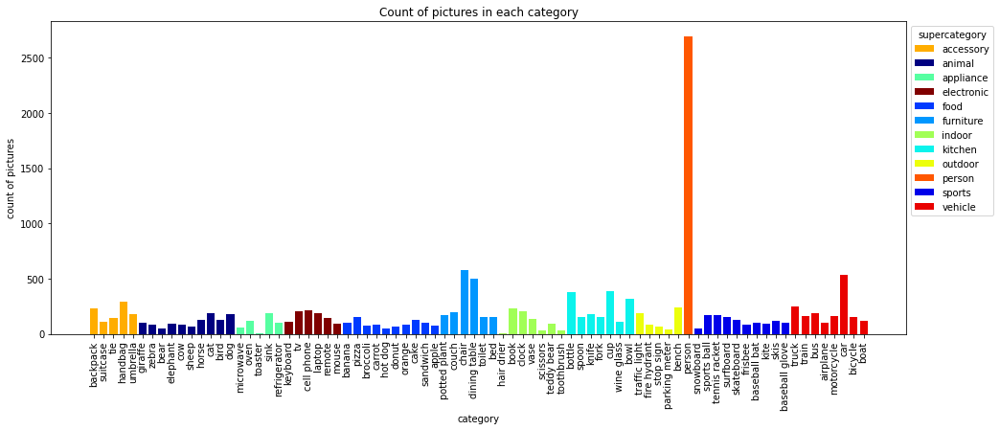

In [ ]:
import pandas as pd
from matplotlib import pyplot as plt
taxonomy_df = pd.DataFrame(cats)

# count of pictures with the category label
category_counts = {}
for labels in category_multi_labels:
    for label in labels:
        category_counts[label] = category_counts.get(label, 0) + 1

taxonomy_df = taxonomy_df.sort_values('supercategory')

taxonomy_df['count'] = taxonomy_df['name'].map(category_counts)
# taxonomy_df = taxonomy_df.sort_values('count', ascending=False)

cmap = plt.cm.jet
cmaplist = [cmap(i) for i in range(cmap.N)]
cmap = cmap.from_list('Custom cmap', cmaplist, len(supercategory_names))

supercategory_enum = dict(zip(supercategory_names, range(len(supercategory_names))))
colors = taxonomy_df['supercategory'].map(supercategory_enum).map(cmap)

def bar_plotter(index, values, labels, colors, 
                title=None, xlabel=None, ylabel=None, legendtitle=None):
    nbars = len(index)

    x = np.arange(nbars)
    
    fig, ax = plt.subplots(figsize=(16/80 * nbars, 6))

    remaining_labels = set(labels)

    for i, col in enumerate(values):
        if labels[i] in remaining_labels:
            label = labels[i]
            remaining_labels.remove(label)
        else:
            label=None

        ax.bar(i, values[i], color=colors[i], label=label, align='center')

    ax.set_xticks(x)
    
    ax.set_xticklabels(index, rotation=90)
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)

    ax.legend(loc="upper left", bbox_to_anchor=(1,1), title=legendtitle)
    if title:
        ax.set_title(title)
    plt.show()

bar_plotter(taxonomy_df['name'].values, taxonomy_df['count'].values,
            taxonomy_df['supercategory'].values, colors.values, 
            title='Count of pictures in each category',
            xlabel='category',
            ylabel='count of pictures', legendtitle='supercategory'
            )

In [ ]:
print("Number of COCO categories in the data (including None)", len(set(category_labels)), len(set(supercategory_labels)))

Number of COCO categories in the data (including None) 81 13


## Supervised top features

In [ ]:
# let's try to use the embedding feature space to predict the 80 COCO categories using a Random Forest
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split

rfc = RandomForestClassifier(random_state=46, n_estimators=100, verbose=3)

X_rf = X

mlb = MultiLabelBinarizer()
y_rf = mlb.fit_transform(np.array(category_multi_labels))

y = np.array(category_labels)
y = np.where(y == None, 'NA', y)
labels_frequency = pd.Series(y).value_counts()
low_frequency_labels = labels_frequency[labels_frequency < 5].index
y = np.where(np.isin(y, low_frequency_labels), 'other', y)

# split train and test stratyifing on the single-label target y
X_rf_train, X_rf_test, y_rf_train, y_rf_test = train_test_split(X_rf, y_rf, stratify=y, 
                                               test_size=0.2, random_state=46)

print(X_rf_train.shape, y_rf_train.shape,  X_rf_test.shape, y_rf_test.shape)
# train on the multi-label target y_multi
rfc.fit(X_rf_train, y_rf_train)
shrink()

(4000, 2048) (4000, 80) (1000, 2048) (1000, 80)
building tree 1 of 100


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s remaining:    0.0s


building tree 2 of 100


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    2.7s remaining:    0.0s


building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
building tree 43 of 100
building tree 44 of 100

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  2.2min finished


In [ ]:
# We can see that the feature space can accurately separate the COCO categories
# multi-label accuracy, true only if the exact combination of labels matches
rfc.score(X_rf_train, y_rf_train), rfc.score(X_rf_test, y_rf_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished


(1.0, 0.167)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished


Confusion matrix, without normalization
[[  933  2075]
 [  115 76877]]


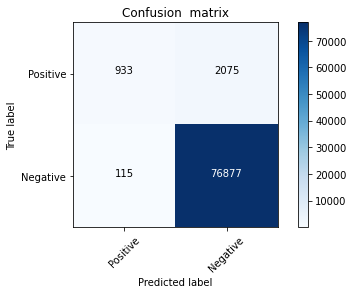

              precision    recall  f1-score   support

    Positive       0.89      0.31      0.46      3008
    Negative       0.97      1.00      0.99     76992

    accuracy                           0.97     80000
   macro avg       0.93      0.65      0.72     80000
weighted avg       0.97      0.97      0.97     80000

Accuracy:  0.972625


In [ ]:
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.metrics import classification_report, accuracy_score

def plot_confusion_matrix(cm, labels,
                          normalize=False,
                          title='Confusion  matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(labels))
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

y_true, y_pred = y_rf_test.flatten(), rfc.predict(X_rf_test).flatten()
cm = confusion_matrix(y_true, y_pred, labels=[1,0])
plot_confusion_matrix(cm, ['Positive', 'Negative'])
print(classification_report(y_true, y_pred, labels=[1, 0], 
                            target_names=['Positive', 'Negative']))
print('Accuracy: ', accuracy_score(y_true, y_pred))

Performances aren't great but we only trained on a very small sample of pictures and most labels had very few occurences. The purpose of this tutorial is not to predict COCO categories but rather to show the effectiveness of the embedding features.

In [ ]:
# top 25 features selected by the random forest multilabel classifier
top_features = np.argsort(rfc.feature_importances_)[::-1][:25]
top_features                            


array([  12,    3, 2011, 1151,   28, 1715, 1004,  583,  479, 1377, 1505,
       1690, 1028, 1831, 1704,  466,  634, 1329, 2003,  176,  485, 1066,
       1669,  445, 1227])

## Features statistics

In [ ]:
import pandas as pd
X_df = pd.DataFrame(X)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
def plot_corr_matrix_heatmap(corr, labels=None):
    assert corr.shape[0] == corr.shape[1]
    n = corr.shape[0]

    if labels is not None:
        corr = pd.DataFrame(corr, index=labels, columns=labels)

    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))
    
    

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(16/24* n, 12/24 * n))

    # Generate a custom diverging colormap
    # TODO: find a suitable diverging cmap with white at value 0 
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    # cmap=plt.get_cmap("RdYlGn")

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, center=0, cmap=cmap, vmin=-1, vmax=1,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})




Text(0.5, 1.0, 'Correlation matrix of top 25 features')

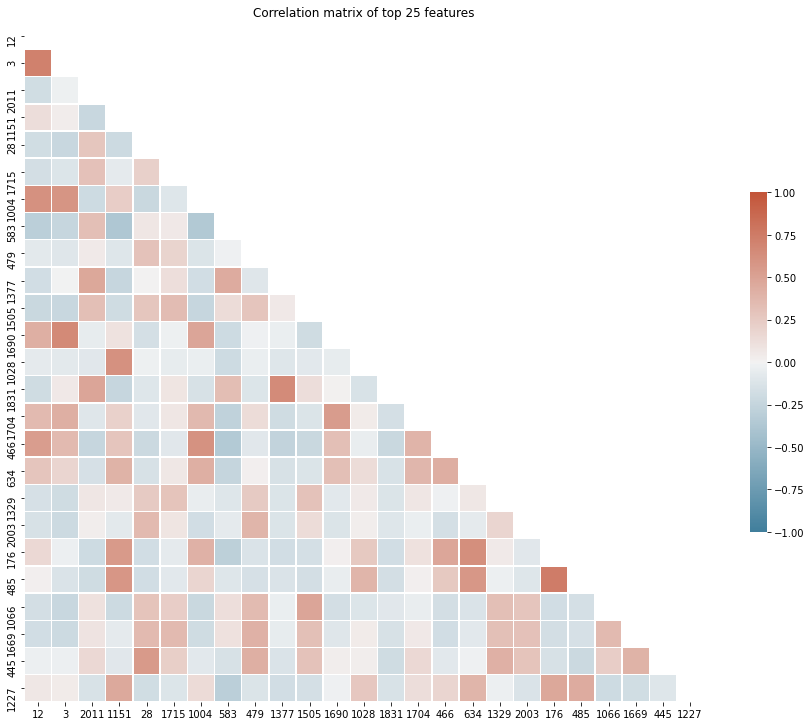

In [ ]:
# correlation matrix
corr = X_df.iloc[:, top_features].corr().values

plot_corr_matrix_heatmap(corr, labels=top_features)
plt.title('Correlation matrix of top 25 features')

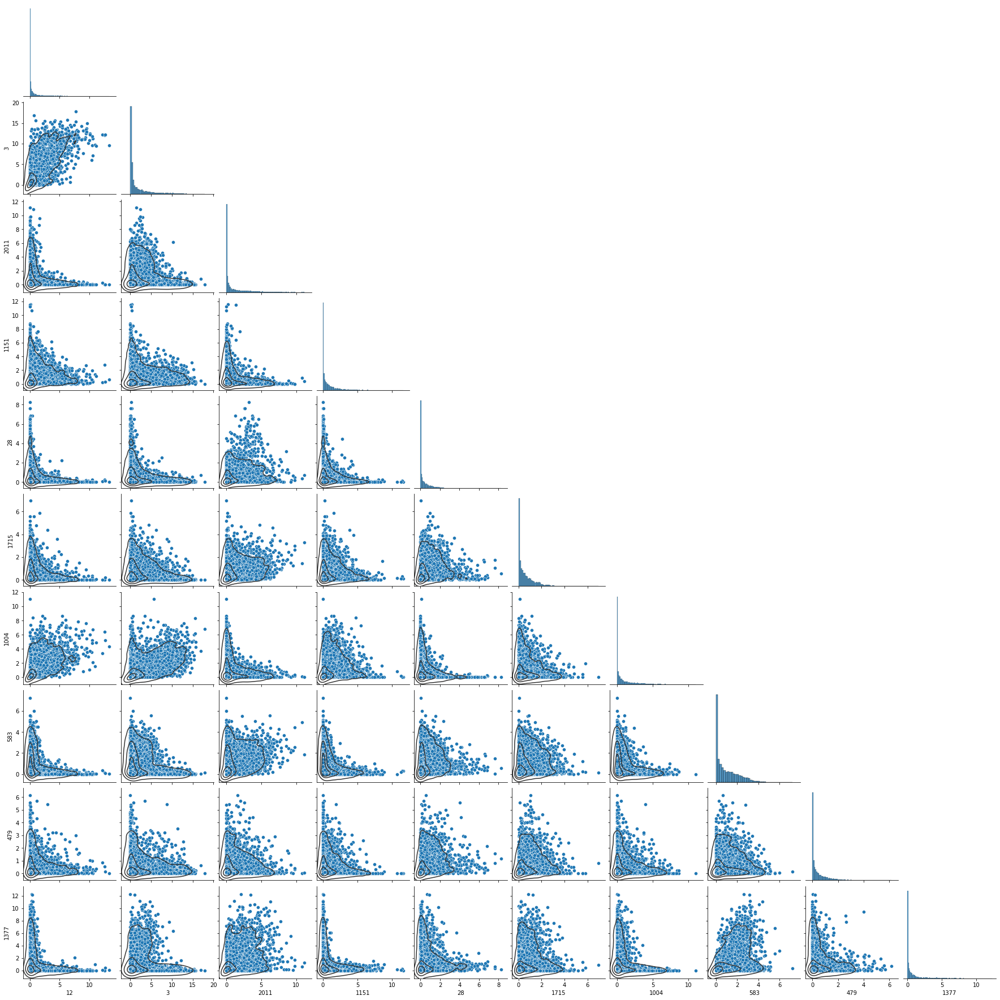

In [ ]:
g=sns.pairplot(X_df[top_features[:10]].assign(supercategory=supercategory_labels), 
               corner=True)
g.map_lower(sns.kdeplot, levels=4, color=".2")

We can conclude two things:
1. The feature space is slightly sparse (many feature values are close to 0)
2. The feature values follow an exponential distribution

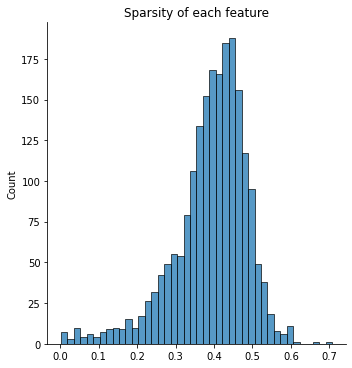

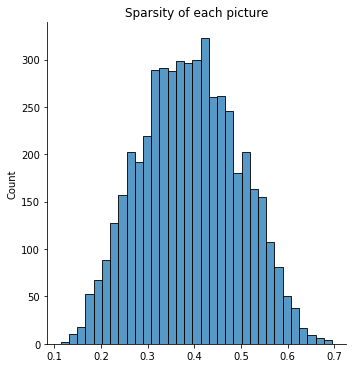

In [ ]:
# We can observe that features are activated in average 40% of the time

sns.displot((X_df < 0.1).mean(axis=0))
plt.title('Sparsity of each feature')
plt.show()

sns.displot((X_df < 0.1).mean(axis=1))
plt.title('Sparsity of each picture')
plt.show()

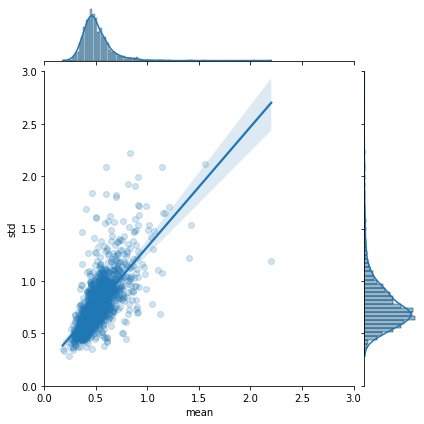

In [ ]:
# We can confirm the exponential distribution of each feature showing 
# the non-negativity and the proportionality between the mean and the standard deviation

h = sns.jointplot(data=X_df.agg(['mean', 'std'], axis=0).T, x='mean', y='std', 
                  kind='reg', joint_kws = {'scatter_kws':dict(alpha=0.2)},
                  xlim=(0,3), ylim=(0,3))

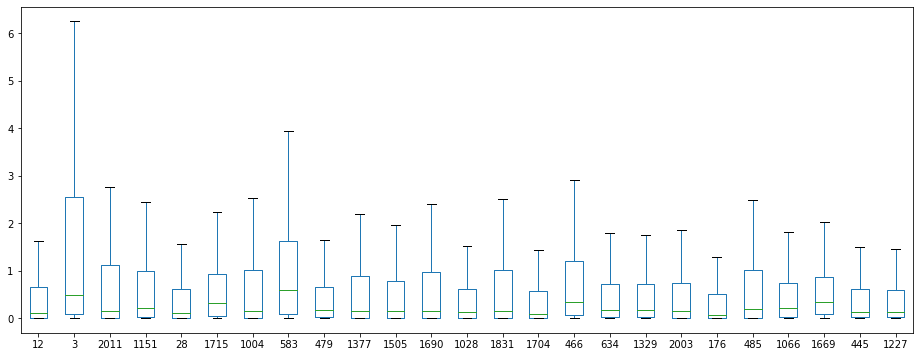

In [ ]:
X_df[top_features].plot.box(figsize=(16,6), showfliers=False)

In [ ]:
X_df[top_features].describe()

,12,3,2011,1151,28,1715,1004,583,479,1377,1505,1690,1028,1831,1704,466,634,1329,2003,176,485,1066,1669,445,1227
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,0.761937,2.027021,0.886950,0.774084,0.498033,0.619006,0.810734,0.979473,0.492231,0.910494,0.563692,0.923521,0.830867,0.916998,0.523713,0.848020,0.683110,0.513774,0.651597,0.814414,0.884418,0.559163,0.592871,0.492595,0.549961
std,1.568478,3.131494,1.487694,1.260262,0.882967,0.776773,1.356425,1.063696,0.750404,1.721682,0.898079,1.715504,2.223216,1.627285,1.002212,1.178979,1.239969,0.805445,1.184609,1.924538,1.590015,0.813227,0.679537,0.800541,0.993580
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.092634,0.000000,0.016037,0.000000,0.048169,0.000000,0.086555,0.010603,0.002748,0.000000,0.006395,0.001380,0.002666,0.000000,0.052585,0.012496,0.012502,0.003555,0.000000,0.004473,0.029994,0.093925,0.017357,0.014210
50%,0.095917,0.494444,0.148842,0.207347,0.114182,0.324554,0.152070,0.579781,0.164359,0.146204,0.140431,0.155447,0.125075,0.155325,0.080524,0.338114,0.171024,0.178200,0.136714,0.054993,0.193540,0.206214,0.344885,0.131300,0.135940
75%,0.653657,2.557103,1.106629,0.983915,0.620916,0.921256,1.010293,1.630201,0.661060,0.877458,0.788322,0.971568,0.613856,1.007213,0.574810,1.195201,0.724741,0.706648,0.743277,0.515095,1.002862,0.746945,0.871030,0.606115,0.591504
max,13.354285,17.865005,11.143258,11.600216,8.254983,6.962574,11.028579,7.196023,6.160217,12.276475,8.297559,13.455853,19.073303,10.796453,8.622356,8.705256,11.670819,8.545389,10.478599,15.095960,11.183398,6.199067,5.473324,6.563977,9.488051


Text(0.5, 1.0, 'Distribution of the l2 norm of each picture')

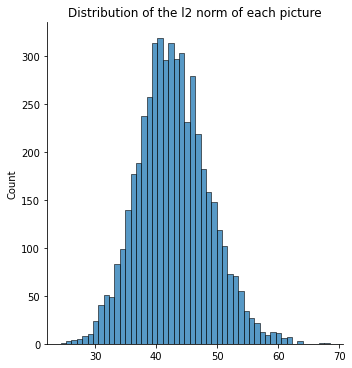

In [ ]:
# Not every picture contains the same level of information

sns.displot(np.linalg.norm(X, axis=1))
plt.title('Distribution of the l2 norm of each picture')

## 3D visualization

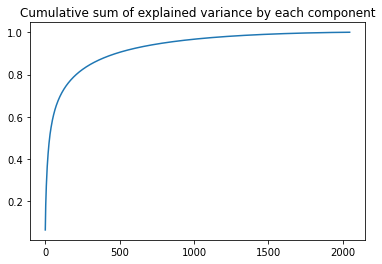

In [ ]:
# Extracting all of the principal components 

from sklearn.decomposition import PCA
pca = PCA(n_components=X.shape[1])
X_pca = pca.fit_transform(X)
plt.plot(range(X_pca.shape[1]), np.cumsum(pca.explained_variance_ratio_))
plt.title('Cumulative sum of explained variance by each component')
plt.show()

In [ ]:
# Reducing the dimensionality to 3 for visualization purposes
from sklearn.manifold import TSNE
tsne3 = TSNE(n_components=3, verbose=1,random_state=46, 
              perplexity=40, n_iter=300)
X_tsne = tsne3.fit_transform(X)
X_tsne.shape

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 1.472s...
[t-SNE] Computed neighbors for 5000 samples in 106.937s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 9.556918
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.983368
[t-SNE] KL divergence after 300 iterations: 1.508753


(5000, 3)

In [ ]:
import umap
umap3 = umap.UMAP(
                random_state=46,
                n_neighbors=30,
                min_dist=0.0,
                n_components=3)

X_umap = umap3.fit_transform(X)
X_umap.shape

(5000, 3)

In [ ]:
import pandas as pd
#TODO: replace with interactive plotly such that we may not need the tensorboard
def plot_3d(X_tsne, labels, title=None, columns=['x0', 'x1', 'x2'], **kwargs):
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    df = pd.DataFrame(X_tsne, columns=columns)
    df['label'] = labels
    cmap = plt.get_cmap('gist_rainbow')
    unique_labels = list(set(labels))
    labels_dict = {label: i for i, label in enumerate(unique_labels)}
    num_colors = len(unique_labels)
    c = [cmap(1.*labels_dict[label]/num_colors) for label in labels]

    df['c'] = c
    df = df[~df['label'].isna()]
    ax = plt.figure(figsize=(16,10)).gca(projection='3d')
    
    for label, grp in df.groupby('label'):
        ax.scatter(
        xs=grp[columns[0]], 
        ys=grp[columns[1]], 
        zs=grp[columns[2]], 
        c=grp['c'], 
        label=label,
        **kwargs
    #     cmap='gist_rainbow'
    )
    
    ax.set_xlabel(columns[0])
    ax.set_ylabel(columns[1])
    ax.set_zlabel(columns[2])
    
    plt.legend(loc='best')
    if title:
        plt.title(title)
    plt.show()


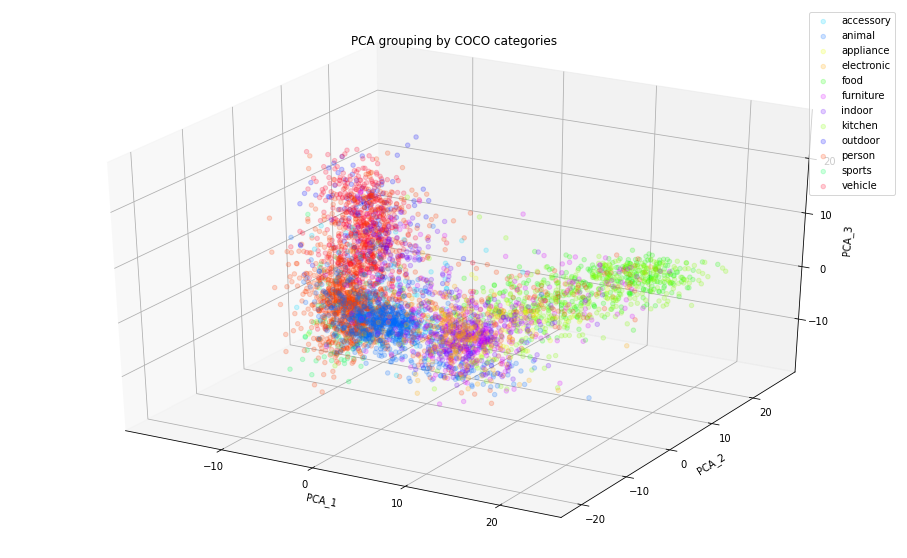

In [ ]:
plot_3d(X_pca[:, :3], supercategory_labels, 'PCA grouping by COCO categories', columns=['PCA_1', 'PCA_2', 'PCA_3'], alpha=0.2)

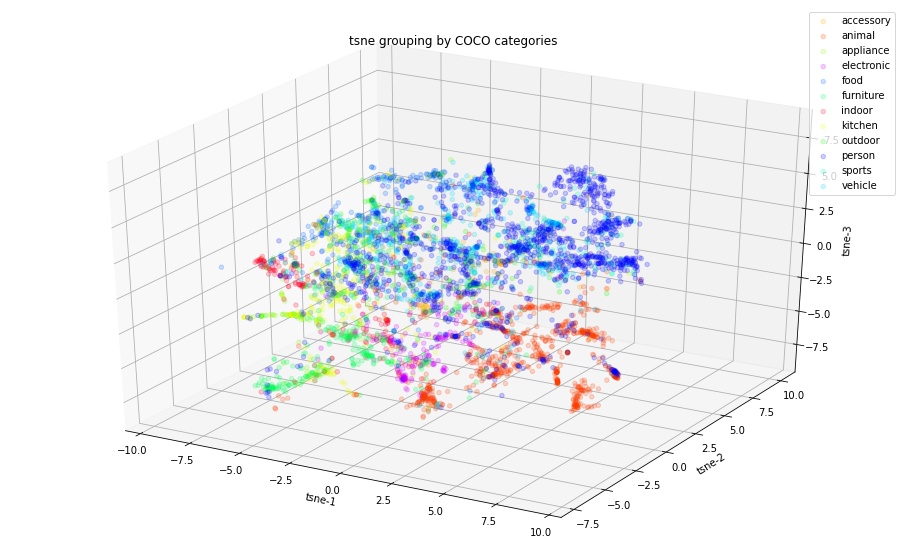

In [ ]:
plot_3d(X_tsne, supercategory_labels, 'tsne grouping by COCO categories', columns=['tsne-1', 'tsne-2', 'tsne-3'], alpha=0.2)

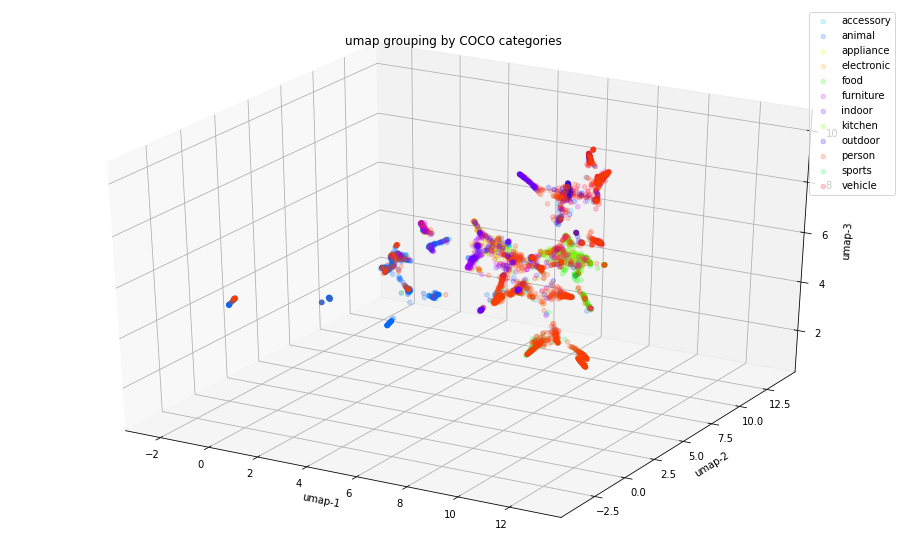

In [ ]:
plot_3d(X_umap, supercategory_labels, 'umap grouping by COCO categories', columns=['umap-1', 'umap-2', 'umap-3'], alpha=0.2)

## Interactive exploration in Tensorboard

In [ ]:
import os
import shutil
from tensorboard.plugins import projector
import tensorflow.compat.v1 as tf

In [ ]:
# the text labels to assign to each picture
metadata = [f'{img_id}: {supercategory}/{category}' for img_id, category, supercategory in zip(image_ids, category_labels, supercategory_labels)]
metadata[:10]

['139: furniture/chair',
 '285: animal/bear',
 '632: indoor/book',
 '724: outdoor/stop sign',
 '776: indoor/teddy bear',
 '785: person/person',
 '802: appliance/refrigerator',
 '872: sports/person',
 '885: person/person',
 '1000: person/person']

In [ ]:
import numpy as np
#from https://medium.com/looka-engineering/how-to-visualize-feature-vectors-with-sprites-and-tensorflows-tensorboard-3950ca1fb2c7
def create_sprite(data):
    """
    Tile images into sprite image. 
    Add any necessary padding
    """

    # For B&W or greyscale images
    if len(data.shape) == 3:
        data = np.tile(data[...,np.newaxis], (1,1,1,3))

    n = int(np.ceil(np.sqrt(data.shape[0])))
    padding = ((0, n ** 2 - data.shape[0]), (0, 0), (0, 0), (0, 0))
    data = np.pad(data, padding, mode='constant',
            constant_values=0)
    
    # Tile images into sprite
    data = data.reshape((n, n) + data.shape[1:]).transpose((0, 2, 1, 3, 4))
    # print(data.shape) => (n, image_height, n, image_width, 3)
    
    data = data.reshape((n * data.shape[1], n * data.shape[3]) + data.shape[4:])
    # print(data.shape) => (n * image_height, n * image_width, 3) 
    return data

In [ ]:
import cv2

# Max sprite size to make visualization easy
# MAX_NUMBER_SAMPLES = 8191 
MAX_NUMBER_SAMPLES = 500

IMAGE_SIZE = (64, 64)
# Load and stack all of the images in a single array, it may take up to ~10 minutes
# as alternative you could use `collage` bash script
img_data = []
for img_id in tqdm(coco_val.ids[:MAX_NUMBER_SAMPLES]):
    img = coco.loadImgs(img_id)[0]['coco_url']
    input_img = cv2.imread(img)

    # extract first frame in case of animated gif
    if input_img is None:
        gif = cv2.VideoCapture(img)
        okay, frame = gif.read()
        input_img = frame

    input_img_resize = cv2.resize(input_img, IMAGE_SIZE) 
    img_data.append(input_img_resize)


img_data = np.array(img_data)

sprite = create_sprite(img_data)

100%|██████████| 500/500 [00:50<00:00,  9.86it/s]


In [ ]:
sprite.shape, np.moveaxis(sprite, 0, 2).shape

((1472, 1472, 3), (1472, 3, 1472))

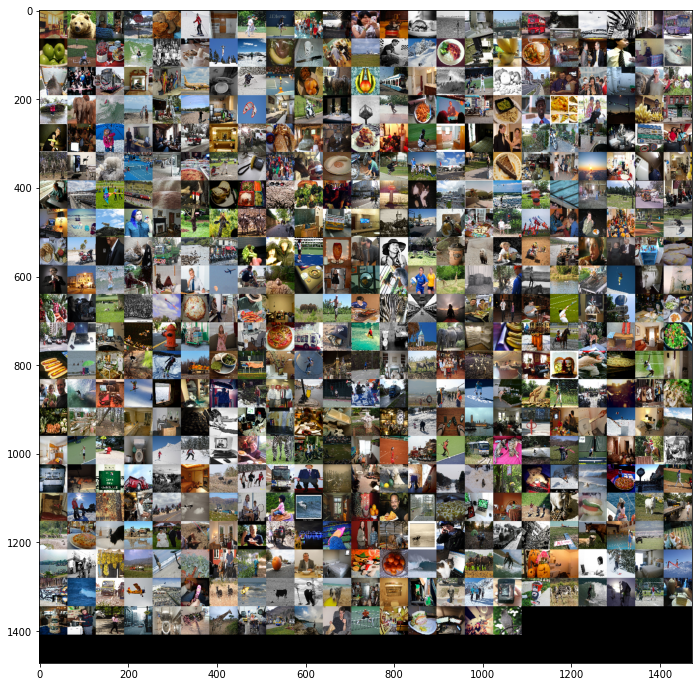

In [ ]:
# the sprite image is in BGR format, let's convert to RGB to visualize it with matplotlib
plt.imshow(cv2.cvtColor(sprite,cv2.COLOR_BGR2RGB))
plt.gcf().set_size_inches(12,12)

In [ ]:
import os
import shutil
from tensorboard.plugins import projector
import tensorflow.compat.v1 as tf
import cv2

def store_embedding_matrix(embedding_matrix, 
                           embedding_matrix_metadata, 
                           name, 
                           log_folder="./tensorboard_log",
                           metadata_path="metadata.txt",
                           sprite=None,
                           sprite_image_name='sprite.png', 
                           sprite_single_image_dim=(64, 64)):
    log_folder = f"{log_folder}"
    tf.disable_v2_behavior()
    if os.path.exists(log_folder):
        shutil.rmtree(log_folder)
    os.makedirs(log_folder)
    print(f"Store metadata for tensorboard")
    with open(os.path.join(log_folder, metadata_path), mode="wb") as metadata_f:
        for metadata in embedding_matrix_metadata:
            metadata_f.write(metadata.encode('utf-8') + b"\n")
    print(f"Building a mocked tf graph")
    embedding_tensor = tf.Variable(embedding_matrix, name=name, dtype=tf.float32)
    config = projector.ProjectorConfig()
    tensor_config = config.embeddings.add()
    tensor_config.tensor_name = embedding_tensor.name
    tensor_config.metadata_path = metadata_path

    print('Save sprite image')
    if sprite is not None:
        sprite_image_path = os.path.join(log_folder, sprite_image_name)
        cv2.imwrite(sprite_image_path, sprite)
        tensor_config.sprite.image_path = sprite_image_path
        tensor_config.sprite.single_image_dim.extend(sprite_single_image_dim)
    
    print(f"Write summaries")
    summary_writer = tf.summary.FileWriter(log_folder)
    projector.visualize_embeddings(summary_writer, config)
    print(f"Store session")
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        saver = tf.train.Saver(save_relative_paths=True)
        saver.save(sess, os.path.join(log_folder, "checkpoint.ckpt"))

In [ ]:
LOG_FOLDER = os.path.join(data_dir, "tensorboard_log")

store_embedding_matrix(
    embedding_matrix = X_normalized, 
    embedding_matrix_metadata=metadata, 
    log_folder=LOG_FOLDER,
    sprite=sprite,
    name='COCO-resnext-features'
)

Instructions for updating:
non-resource variables are not supported in the long term
Store metadata for tensorboard
Building a mocked tf graph
Save sprite image
Write summaries
Store session


Let's open the embedding matrix into the interactive TensorBoard. After the service is started, select "PROJECTOR" from the top right menu.

Please be careful the tensorboard might slow down your browser.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {LOG_FOLDER}

## Similar pictures (nearest neighbours)

Let's zoom into a few pictures manually picked from the clusters identified in the tensorboard


In [ ]:
from sklearn.neighbors import NearestNeighbors

nbrs = NearestNeighbors(n_neighbors=16, algorithm='auto', metric='cosine').fit(X)
nbrs

NearestNeighbors(metric='cosine', n_neighbors=16)

In [ ]:
def plot_neighbors(img_id, X, image_ids, nbrs, show_annotations=False):
    img_index = np.argwhere(np.array(image_ids) == img_id)[0]

    distances, indices = nbrs.kneighbors(X[img_index, :], 16)
    distances, indices = distances[0], indices[0]
    neighbors_ids = np.array(image_ids)[indices]
    np.insert(neighbors_ids, 0, img_id)
    np.insert(distances, 0, 0)
    
    title_suffix = np.array([f'distance={distance:.2f}' for distance in distances])
    figtitle=f'Neighbors of {img_id}'
    plot_coco_images(neighbors_ids.reshape(4, 4), 
                     title_suffix=title_suffix.reshape(4,4),
                     show_annotations=show_annotations,
                     figtitle=figtitle)

In [ ]:
# bike's neighborhood
img_id = 210299
# plot_neighbors(img_id, X, image_ids, nbrs, show_annotations=True)
plot_neighbors(img_id, X, image_ids, nbrs, show_annotations=False)

In [ ]:
# tennis players
plot_neighbors(397279, X, image_ids, nbrs)

In [ ]:
# home living room with sofas

plot_neighbors(367386, X, image_ids, nbrs)

In [ ]:
# skiing
plot_neighbors(576031, X, image_ids, nbrs)

In [ ]:
# cats on laptops
plot_neighbors(119233, X, image_ids, nbrs)

In [ ]:
# food on a plate
plot_neighbors(image_ids[891], X, image_ids, nbrs)

In [ ]:
# large animals exhibition
plot_neighbors(114907, X, image_ids, nbrs)

We can see that the feature space does a great job in grouping close together pictures sharing similar topics.
We can also observe that although a picture may contain several annotations of different categories, the main object, or contextual topic, is what is extracted and shared in the neighborhood.

We can also see that certain pictures have much smaller distance (e.g. tennis or skiing) compared to other picture topics that intrinsically contain more entropy.

# Clustering

## Sparse coding (dictionary learning)

In [ ]:
# K-SVD adapted implementation from P-SIF authors
# Source: https://github.com/vgupta123/P-SIF/blob/master/20NewsGroup/ksvd/__init__.py
import numpy as np
import scipy as sp
from sklearn.linear_model import orthogonal_mp_gram

class ApproximateKSVD(object):
    def __init__(self, n_components, max_iter=10, tol=1e-6,
                 transform_n_nonzero_coefs=None):
        """
        Parameters
        ----------
        n_components:
            Number of dictionary elements
        max_iter:
            Maximum number of iterations
        tol:
            tolerance for error
        transform_n_nonzero_coefs:
            Number of nonzero coefficients to target
        """
        self.components_ = None
        self.max_iter = max_iter
        self.tol = tol
        self.n_components = n_components
        self.transform_n_nonzero_coefs = transform_n_nonzero_coefs

    def _update_dict(self, X, D, gamma):
        for j in range(self.n_components):
            I = gamma[:, j] > 0
            if np.sum(I) == 0:
                continue

            D[j, :] = 0
            g = gamma[I, j].T
            r = X[I, :] - gamma[I, :].dot(D)
            d = r.T.dot(g)
            d /= np.linalg.norm(d)
            g = r.dot(d)
            D[j, :] = d
            gamma[I, j] = g.T
        return D, gamma

    def _initialize(self, X):
        if min(X.shape) < self.n_components:
            D = np.random.randn(self.n_components, X.shape[1])
        else:
            u, s, vt = sp.sparse.linalg.svds(X, k=self.n_components)
            D = np.dot(np.diag(s), vt)
        D /= np.linalg.norm(D, axis=1)[:, np.newaxis]
        return D

    def _transform(self, D, X):
        gram = D.dot(D.T)
        Xy = D.dot(X.T)

        n_nonzero_coefs = self.transform_n_nonzero_coefs
        if n_nonzero_coefs is None:
            n_nonzero_coefs = int(0.1 * X.shape[1])

        return orthogonal_mp_gram(
            gram, Xy, n_nonzero_coefs=n_nonzero_coefs).T

    def fit(self, X):
        """
        Parameters
        ----------
        X: shape = [n_samples, n_features]
        """
        D = self._initialize(X)
        for i in range(self.max_iter):
            gamma = self._transform(D, X)
            e = np.linalg.norm(X - gamma.dot(D))
            if e < self.tol:
                break
            D, gamma = self._update_dict(X, D, gamma)

        self.components_ = D
        return self

    def transform(self, X):
        return self._transform(self.components_, X)

In [ ]:
X.shape

(5000, 2048)

In [ ]:
aksvd = ApproximateKSVD(n_components=50, transform_n_nonzero_coefs=10)
aksvd.fit(X)
# X_sparse = aksvd.transform(X)

In [ ]:
#clusters weights
X_proba = aksvd.transform(X)
X_proba.shape
                            

(5000, 50)

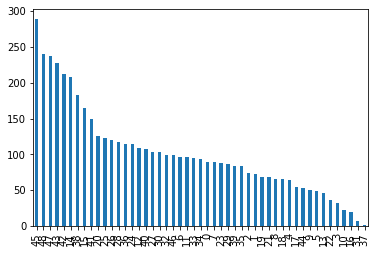

In [ ]:
X_clusters = np.argmax(X_proba, axis=1)
pd.Series(X_clusters).value_counts().plot.bar()

In [ ]:
dictionary = aksvd.components_

print(dictionary.shape)
dictionary

(50, 2048)


array([[ 0.00350382, -0.01733229,  0.00211462, ..., -0.00627033,
        -0.01050835, -0.01328122],
       [ 0.002279  ,  0.06217359, -0.00774357, ...,  0.01893977,
         0.00612851, -0.00923631],
       [ 0.00486357, -0.03047611, -0.00246347, ..., -0.01949475,
        -0.01235313, -0.00255475],
       ...,
       [-0.00523237, -0.02544959,  0.02637029, ..., -0.01121225,
        -0.00820065,  0.00468939],
       [-0.00656488, -0.00530655, -0.0251813 , ..., -0.01111698,
        -0.01244515, -0.01610994],
       [-0.01233701, -0.02545936, -0.02034359, ..., -0.0164139 ,
        -0.01567252, -0.02346539]], dtype=float32)

In [ ]:
import time
while True:
    time.sleep(100)
    

## Soft Clustering using GMM

In [ ]:
import umap
# Clustering algorithms don't perform well on a large-dimensional space (2048 in our case)
# let's reduce it using UMAP to 50 dimensions
umap50 = umap.UMAP(
                random_state=46,
                n_neighbors=30,
                min_dist=0.0,
                n_components=50)
X_umap50 = umap50.fit_transform(X)

In [ ]:
import sklearn
import numpy as np
from sklearn import mixture
from sklearn.metrics import silhouette_score

import itertools
import random

# Select best model based on the minimization of the 
# Bayesian Information Criterion (BIC)

#init
gmm_dict = {}

#Explanations of the different covariance types: https://stats.stackexchange.com/questions/326671/different-covariance-types-for-gaussian-mixture-models
cv_types = ['spherical', 'tied', 'diag', 'full']
feature_spaces = {'original': X, 'umap': X_umap}
k_range = range(5, 81, 5)

configurations = list(itertools.product(k_range, cv_types))
random.shuffle(configurations)

for k, cv_type in tqdm(configurations):
    if (k, cv_type) not in gmm_dict:
        try:
            gmm = mixture.GaussianMixture(n_components=k, 
                                         covariance_type=cv_type,
                                         reg_covar=1e-4,
                                         random_state=46)
            gmm.fit(X_umap50)
            bic = gmm.bic(X_umap50)
            silhouette = silhouette_score(X_umap50, gmm.predict(X_umap50))
            gmm_dict[(k, cv_type)] = {'bic': bic, 'silhouette': silhouette}
        except Exception as e:
            print(k, cv_type)
            print(e)


100%|██████████| 64/64 [01:34<00:00,  1.47s/it]


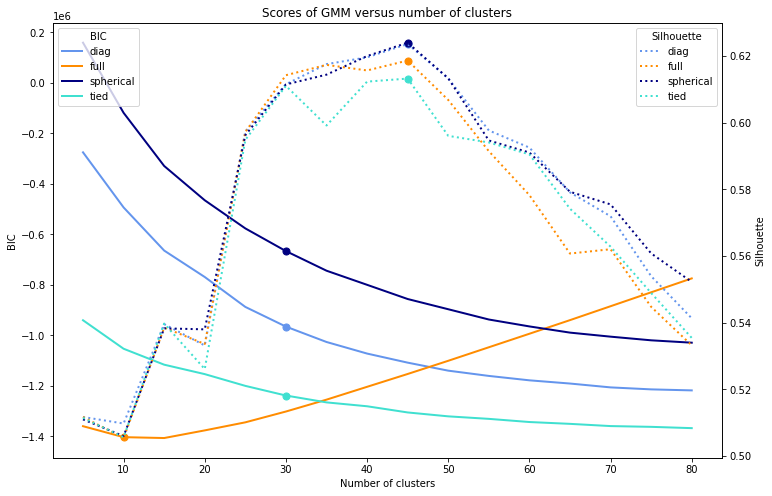

In [ ]:
from kneed import KneeLocator

# use linestyles to plot as a function of the data transformation, if any
# linestyles={'original': 'solid', 'pca': 'dotted', 'umap': "dashed"}
colors = {'spherical': 'navy', 'tied': 'turquoise', 'diag': 'cornflowerblue', 'full': 'darkorange'}

import pandas as pd
gmm_models_scores = pd.DataFrame([(config[0], config[1], scores['bic'], scores['silhouette'])
 for config, scores in gmm_dict.items()], columns=[ 'k', 'cv_type', 'bic', 'silhouette'])

fig, ax1 = plt.subplots(figsize=(12,8))
ax2 = ax1.twinx()
for cv_type, cv_type_scores in gmm_models_scores.groupby('cv_type'):

    cv_type_scores = cv_type_scores.sort_values(by='k')
    x = cv_type_scores['k'].values

    # plot bic
    y = cv_type_scores['bic'].values
    kn = KneeLocator(x, y, curve='convex', direction='decreasing')
    sns.lineplot(x=x, y=y, 
                 label=cv_type, color=colors[cv_type], linewidth=2, ax=ax1)
    ax1.scatter(kn.knee, kn.elbow_y, color=colors[cv_type], s=50)

    # plot silhouette
    y = cv_type_scores['silhouette'].values
    ymaxi = np.argmax(y)


    sns.lineplot(x=x, y=y, 
                 label=cv_type, color=colors[cv_type],
                 linewidth=2, ax=ax2)
    ax2.lines[-1].set_linestyle('dotted')
    ax2.scatter(x[ymaxi], y[ymaxi], color=colors[cv_type], s=50)


ax1.legend(loc='upper left', title='BIC')
ax2.legend(loc='upper right', title='Silhouette')
ax1.set_xlabel('Number of clusters')
ax1.set_ylabel("BIC")
ax2.set_ylabel("Silhouette")
plt.title("Scores of GMM versus number of clusters" )
plt.show()

As we could see the full cv_type introduces too many degrees of freedom and its BIC diverges with the increase of the number of components.

The tied covariance matrix is the most constrained and assumes that each cluster has the same shape which is a fair assumption considering the nature of the feature space.

The silhouette score would suggest an optimum at 45 which is not too far from the BIC elbow points at 30.

We will use GMM with tied covariance and k = 40.




In [ ]:
# You can also skip the model selection
from sklearn import mixture

best_config = (40, 'tied')
best_gmm = mixture.GaussianMixture(n_components=best_config[0], 
                                   covariance_type=best_config[1], 
                                   n_init=15,
                                   random_state=46,
                                   reg_covar=1e-4)

best_gmm.fit(X_umap50)

GaussianMixture(covariance_type='tied', init_params='kmeans', max_iter=100,
                means_init=None, n_components=40, n_init=15,
                precisions_init=None, random_state=46, reg_covar=0.0001,
                tol=0.001, verbose=0, verbose_interval=10, warm_start=False,
                weights_init=None)

In [ ]:
X_probs = best_gmm.predict_proba(X_umap50)
X_clusters = best_gmm.predict(X_umap50)

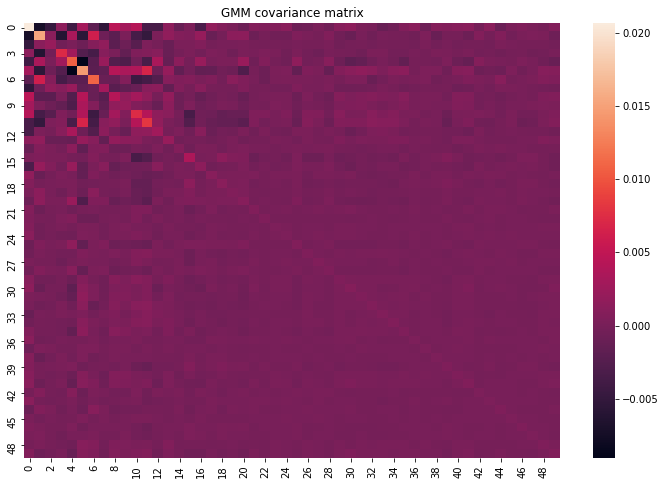

In [ ]:
sns.heatmap(best_gmm.covariances_)
plt.title('GMM covariance matrix')
plt.gcf().set_size_inches(12,8)

Most of the variance is happening in the first 20 components, we may re-apply UAMP with only 20 dimensions

Text(0.5, 1.0, 'Maximum cluster probability per picture')

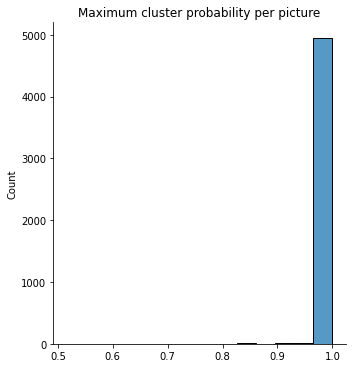

In [ ]:

sns.displot(X_probs.max(axis=1))
plt.title('Maximum cluster probability per picture')

The GMM clustering in the UMAP space correspond to a hard clustering this means there is no ambiguity whether a picture belongs to one or another cluster. This is an expected result considering the UMAP transformation. 

Text(0.5, 1.0, 'Clusters occurences')

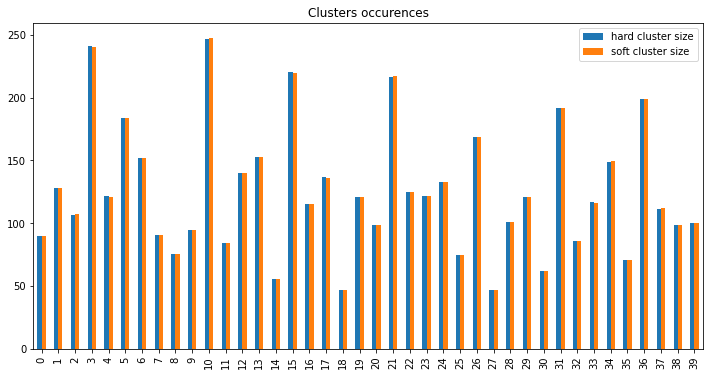

In [ ]:

pd.DataFrame({'hard cluster size': pd.Series(X_clusters).value_counts(),
              'soft cluster size': pd.Series(X_probs.sum(axis=0))}).plot.bar(figsize=(12,6))
plt.title('Clusters occurences')

## Visualizing clusters

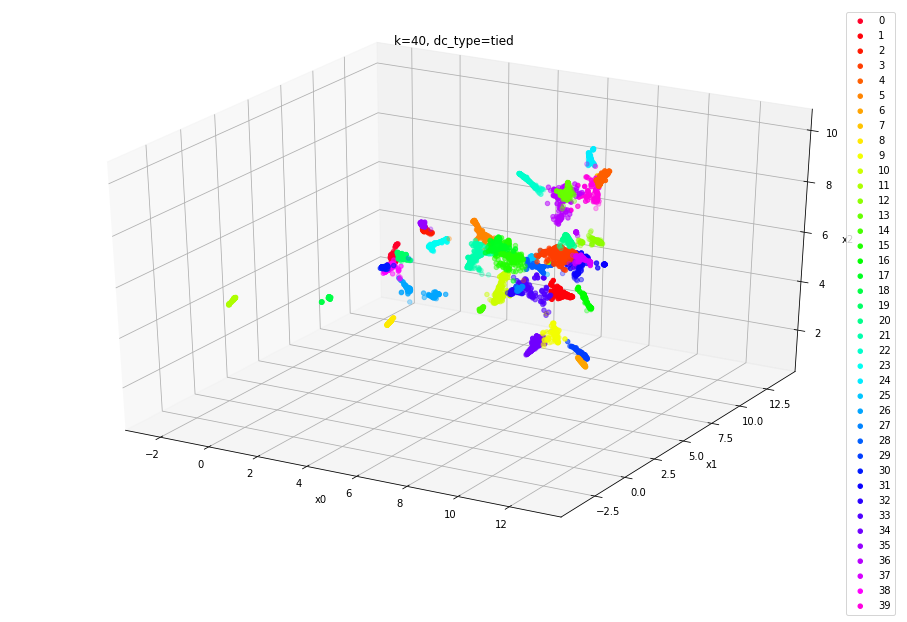

In [ ]:
plot_3d(X_umap, X_clusters, title=f'k={best_config[0]}, dc_type={best_config[1]}')

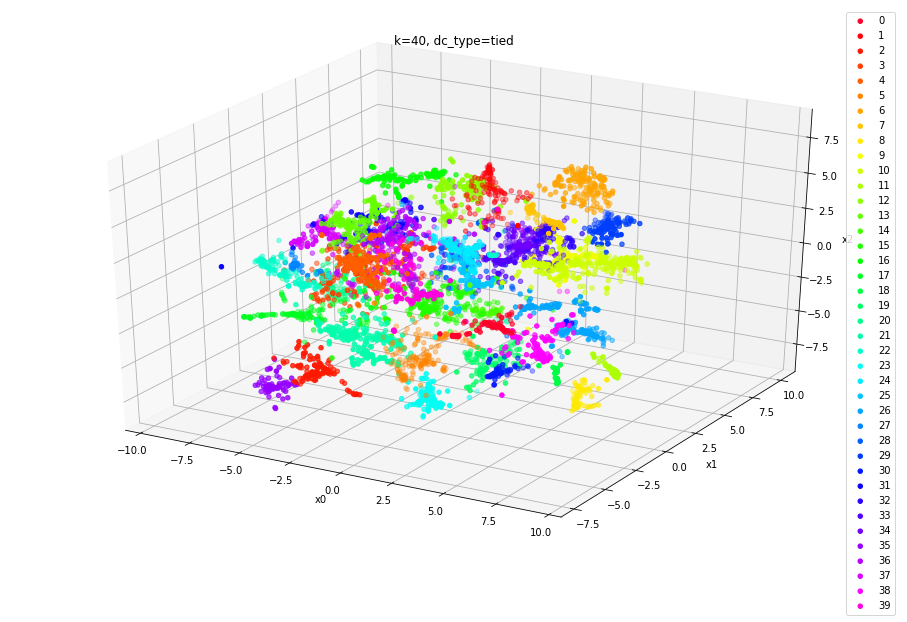

In [ ]:
plot_3d(X_tsne, X_clusters, title=f'k={best_config[0]}, dc_type={best_config[1]}')

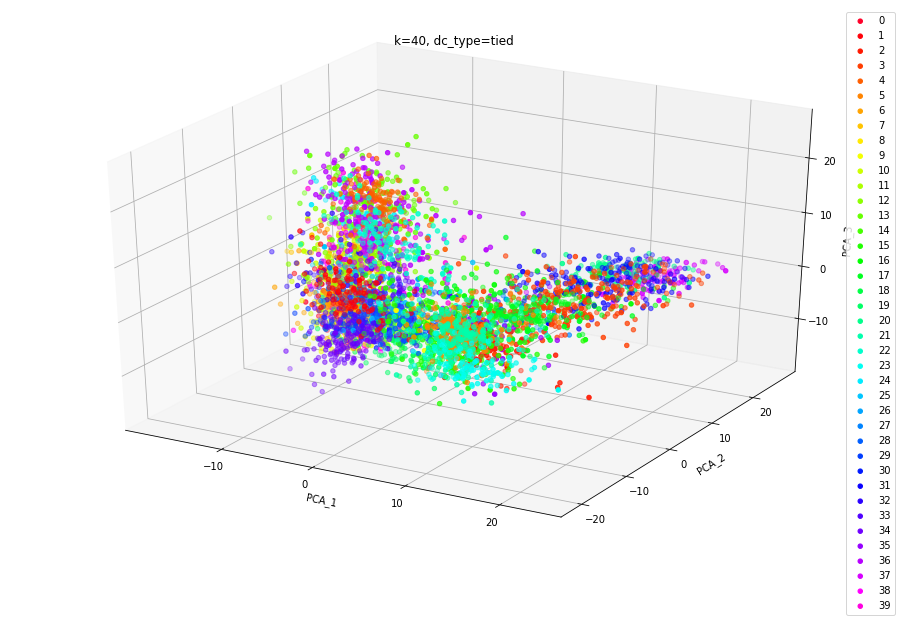

In [ ]:
plot_3d(X_pca[:, :3], X_clusters, title=f'k={best_config[0]}, dc_type={best_config[1]}', columns=['PCA_1', 'PCA_2', 'PCA_3'])

In [ ]:
def plot_cluster_members(centroid, image_ids, nbrs, cluster_id=None):
    distances, indices = nbrs.kneighbors(centroid.reshape(1, -1), 16)
    distances, indices = distances[0], indices[0]
    neighbors_ids = np.array(image_ids)[indices]
    title_suffix = np.array([f'distance={distance:.2f}' for distance in distances])
    plot_coco_images(neighbors_ids.reshape(4,4),
                     title_suffix=title_suffix.reshape(4,4),
                     figtitle=f'Cluster {cluster_id} closest members')
    

In [ ]:
from sklearn.neighbors import NearestNeighbors

nbrs_umap = NearestNeighbors(n_neighbors=16, algorithm='auto',
                        metric='euclidean').fit(X_umap50)
nbrs_umap

NearestNeighbors(metric='euclidean', n_neighbors=16)

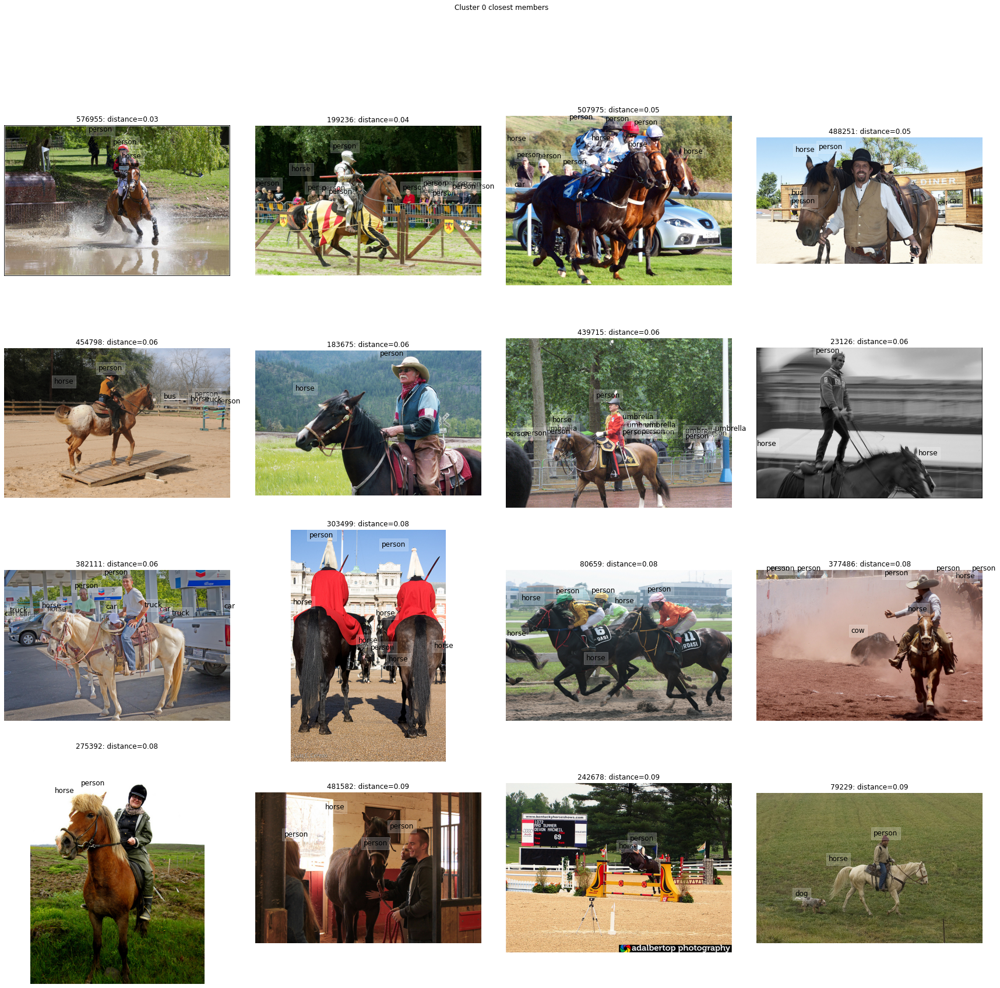

In [ ]:
# horse riding cluster
cluster_id=0
plot_cluster_members(best_gmm.means_[cluster_id], image_ids, nbrs_umap, cluster_id=cluster_id)

In [ ]:
# bears cluster
cluster_id = 18
plot_cluster_members(best_gmm.means_[cluster_id], image_ids, nbrs_umap, cluster_id=cluster_id)

In [ ]:
# sitting near the table with food cluster
cluster_id = 3

plot_cluster_members(best_gmm.means_[cluster_id], image_ids, nbrs_umap, cluster_id=cluster_id)

In [ ]:
# sea and watersports cluster
cluster_id = 10

plot_cluster_members(best_gmm.means_[cluster_id], image_ids, nbrs_umap, cluster_id=cluster_id)

In [ ]:
# tower cluster
cluster_id = 22

plot_cluster_members(best_gmm.means_[cluster_id], image_ids, nbrs_umap, cluster_id=cluster_id)

## Comparing clustering with the category labels

In [ ]:
from sklearn.metrics import adjusted_rand_score

adjusted_rand_score(pd.Series(category_labels).fillna('Other').values, X_clusters)

0.08844429306297526

In [ ]:
adjusted_rand_score(pd.Series(supercategory_labels).fillna('Other').values, X_clusters)

0.0995581804277797

We can see from the Adjusted Rand Index (ARI) that the clustering produced has little to do with the category labels, suggesting that the structures of the data manifolds do not represent the chosen labels taxonomy.

# Document averaging

In this section we want to represent a collection of pictures (a document) in the embedding space.

We will use the COCO categories to represent documents containing all of the pictures that were annotated with that category.

The following methodology can be applied to any "bag of words" model and its weighted versions (e.g. TF-IDF) regardless of the nature of each "word" (in our case pictures).

In [ ]:
# each document is a collection of pictures
docs = []

for label in category_names:
    doc = np.array([label in x for x in category_multi_labels])
    docs.append(doc)
len(docs)

80

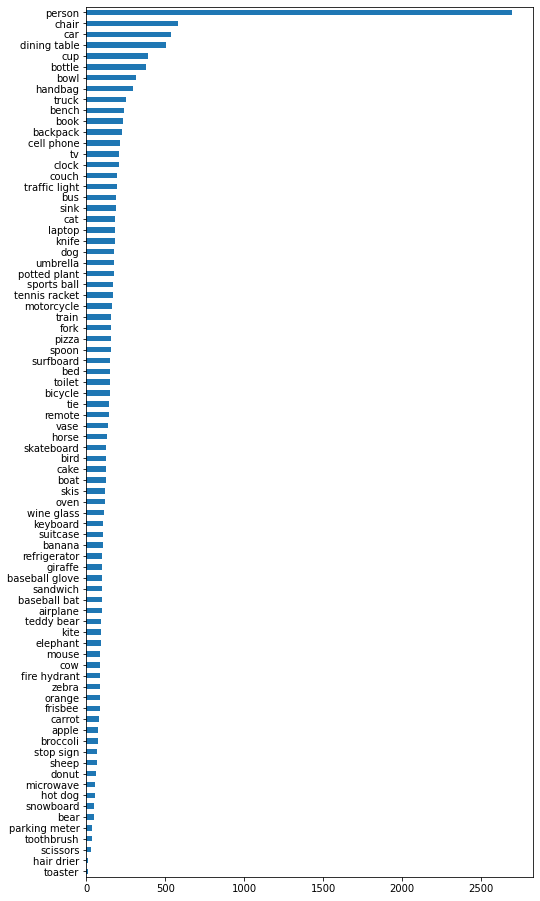

In [ ]:
import pandas as pd
pd.Series([doc.sum() for doc in docs], index=category_names).sort_values().plot(kind='barh', figsize=(8,16))

Text(0.5, 1.0, 'document size')

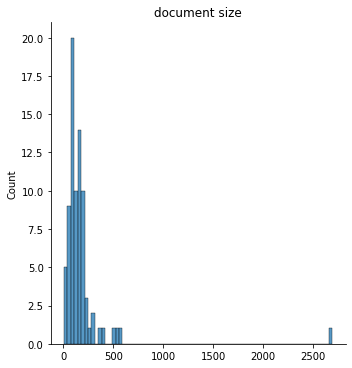

In [ ]:
import seaborn as sns

sns.displot([doc.sum() for doc in docs], bins=78)
plt.title('document size')

In [ ]:
supercategory_doc_labels = [category_taxonomy[label] for label in category_names]

## Term frequency word averaging (BOW)

We can simply average all of the pictures in the document based on the frequency of the label in that picture.

In [ ]:
vocabulary = np.arange(len(image_ids))

# Term frequency of each document
docs_tf = np.zeros(shape=(len(category_names), len(vocabulary)))

for i, label in enumerate(category_names):
    for j, (img_labels_set, img_labels) in enumerate(zip(category_multi_labels, category_multi_labels_counts)):
        if label in img_labels_set:
            # count the frequency
            count = np.sum([x == label for x in img_labels])
            assert count > 0, (i, label, j)
            docs_tf[i, j] = count


cat


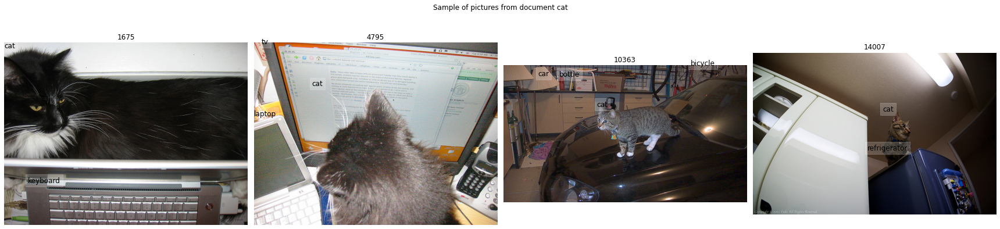

In [ ]:
print(category_names[15])
plot_coco_images(np.array(image_ids)[docs_tf[15] > 0][:4].reshape(1,4), 
                 figtitle=f'Sample of pictures from document {category_names[15]}')

In [ ]:
def weighted_average_words(X, weights):
    return np.matmul(weights, X) / weights.sum(axis=1)[:, None]

docs_average_tf = weighted_average_words(X, docs_tf)
docs_average_tf.shape

(80, 2048)

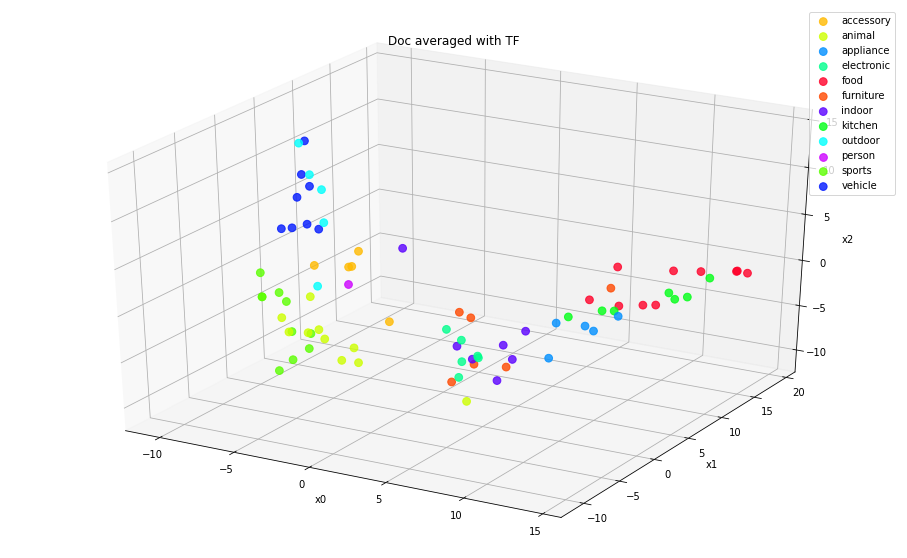

In [ ]:
docs_average_pca = pca.transform(docs_average_tf)
plot_3d(docs_average_pca[:, :3], supercategory_doc_labels, title=f'Doc averaged with TF', alpha=0.8, s=60)  

In [ ]:
docs_average_umap50_tf = weighted_average_words(X_umap50, docs_tf)
docs_average_umap50_tf.shape

(80, 50)

## Weighted averaging (TFIDF)

In [ ]:
from sklearn.feature_extraction.text import TfidfTransformer

docs_tfidf = TfidfTransformer().fit_transform(docs_tf).A
docs_average_tfidf = weighted_average_words(X, docs_tfidf)

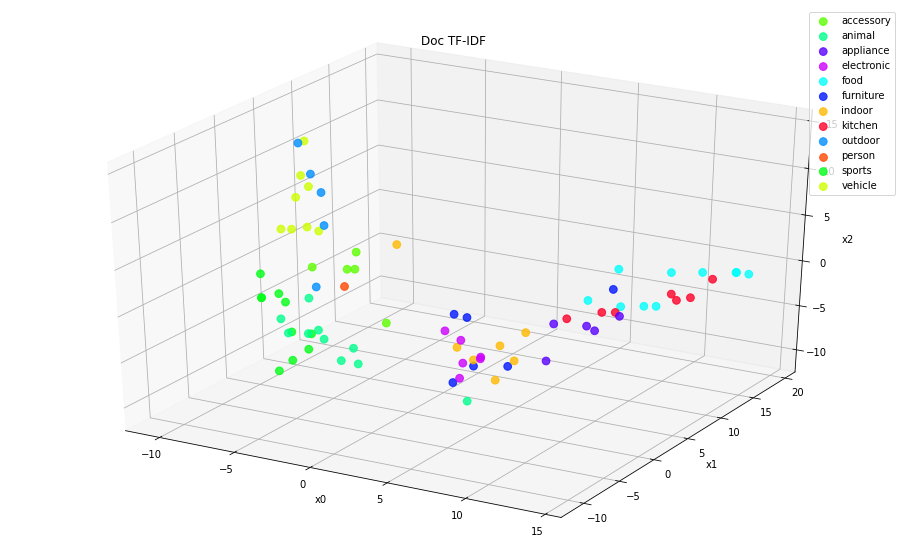

In [ ]:
docs_average_pca = pca.transform(docs_average_tfidf)
plot_3d(docs_average_pca[:, :3], supercategory_doc_labels, title=f'Doc TF-IDF', alpha=0.8, s=60)  

In [ ]:
docs_average_umap50_tfidf = weighted_average_words(X_umap50, docs_tfidf)
docs_average_umap50_tfidf.shape

(80, 50)

## Topics averaging (P-SIF)
We will apply an averaging for each topic (cluster) as described in [Document Embeddings Using Partition Averaging (P-SIF), Gupta V. et al.](https://vgupta123.github.io/docs/AAAI-GuptaV.3656.pdf)

The key intuitions are:
1. Cluster all of the "words" (pictures) in "topics" (clusters) using a soft clustering algorithm (e.g. GMM)
2. For each topic, do the average of the pictures
3. Concat the averages in each topic
4. Remove the first principal component (kind of noise/stop words removal)

In [ ]:
# probability of each word (picture) to belong the document, it is either 0 or 1
p = (docs_tf > 0)
p.shape

(80, 5000)

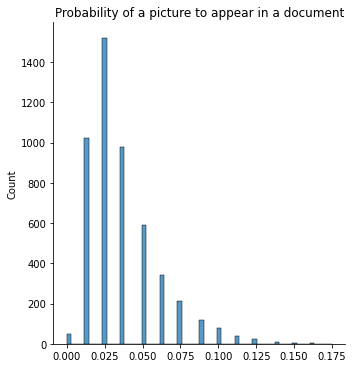

In [ ]:
sns.displot(p.mean(axis=0))
plt.title('Probability of a picture to appear in a document')
plt.show()

In [ ]:
a=1e-3
sif_weights = (a / (a + p)).mean(axis=0)
sif_weights.shape

(5000,)

In [ ]:
docs_average_sif = weighted_average_words(X, p * sif_weights)
docs_average_umap50_sif = weighted_average_words(X_umap50, p * sif_weights)

In [ ]:
from sklearn.pipeline import Pipeline
from tqdm import tqdm

# Let's average within each topic cluster and concatenate
# TODO: vectorize to work for all of the documents in a single computation step
def average_words_by_topic(X, X_probs, doc_id, p, a=1e-3):
    # select only the words belonging to the document
    doc = X[p[doc_id]]

    doc_proba = X_probs[p[doc_id]]
    n_topics = doc_proba.shape[1]

    # smoothed inverse frequency across all documents
    sif_weights = (a / (a + p)).mean(axis=0)
    
    # weighting the document vectors by their corresponding words sif
    doc_sif_weights = sif_weights[p[doc_id]]
    doc_sif = doc * doc_sif_weights[:, None]

    doc_averaged_by_topic = []
    for topic_id in range(n_topics):
        topic_proba = doc_proba[:, topic_id].squeeze()
        topic_doc_vector = ((doc_sif.T * topic_proba).T).mean(axis=0)
        doc_averaged_by_topic.append(topic_doc_vector)
    
    return np.concatenate(doc_averaged_by_topic)


docs_average_umap50_by_topic = np.stack(
    [average_words_by_topic(X_umap50, X_probs, doc_id, p)
    for doc_id in tqdm(range(len(p)))])

docs_average_by_topic = np.stack(
    [average_words_by_topic(X, X_probs, doc_id, p)
    for doc_id in tqdm(range(len(p)))])

print(docs_average_by_topic.shape, docs_average_umap50_by_topic.shape)
shrink()


100%|██████████| 80/80 [00:00<00:00, 317.04it/s]

100%|██████████| 80/80 [00:03<00:00, 20.74it/s]


(80, 81920) (80, 2000)


Original feature space


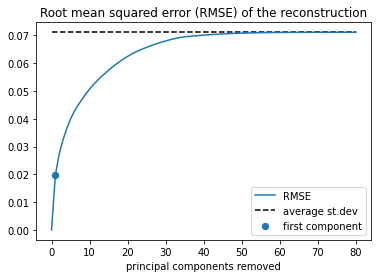

UMAP feature space


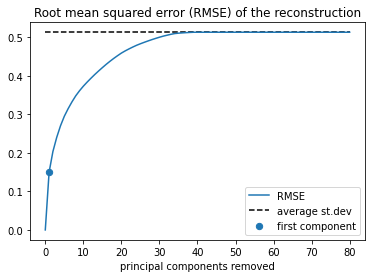

In [ ]:
# let's reconstruct the original document vectors by removing the principal components from all of the documents
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA

#from: https://stats.stackexchange.com/questions/229092/how-to-reverse-pca-and-reconstruct-original-variables-from-several-principal-com
def remove_pca_components(X, pca=None, n_components=1):
    if pca is None:
        pca = PCA()
        pca.fit(X)
        
    V = pca.components_.T
    V[:, :n_components] = 0.
    Z = pca.transform(X)
    mu = X.mean(axis=0)
    result = Z.dot(V.T) + mu
    return result


def plot_reconstruction_curve(X):
    pca = PCA()
    pca.fit(X)

    xmax = min(X.shape)
    x = range(0, xmax+1)

    y = [np.sqrt(((X - remove_pca_components(X, pca, n_components=i))**2).flatten().mean()) for i in x]
    doc_mean = X.mean(axis=0)
    doc_sd = np.sqrt(((X - doc_mean)**2).flatten().mean())

    plt.plot(x, y, label='RMSE')
    plt.hlines(doc_sd, 0, xmax, linestyle='--', label='average st.dev')
    plt.scatter(1, y[1], s = 40, label='first component')
    plt.legend()
    plt.title('Root mean squared error (RMSE) of the reconstruction')
    plt.xlabel('principal components removed')
    plt.show()

print('Original feature space')
plot_reconstruction_curve(docs_average_by_topic)

print('UMAP feature space')
plot_reconstruction_curve(docs_average_umap50_by_topic)


In [ ]:
#Let's remove the first component only
docs_average_psif = remove_pca_components(docs_average_by_topic, pca=None, n_components=1)
docs_average_umap50_psif = remove_pca_components(docs_average_umap50_by_topic, pca=None, n_components=1)

## Compare the methods

In [ ]:
averaged_docs_dict = {
    'bow': docs_average_tf,
    'bow_umap50': docs_averag_tf_umap50,
    'tfidf' : docs_average_tfidf,
    'tfidf_umap50' : docs_average_umap50_tfidf,
    'p-sif': docs_average_psif,
    'p-sif_umap50': docs_average_umap50_psif
}

NameError: ignored

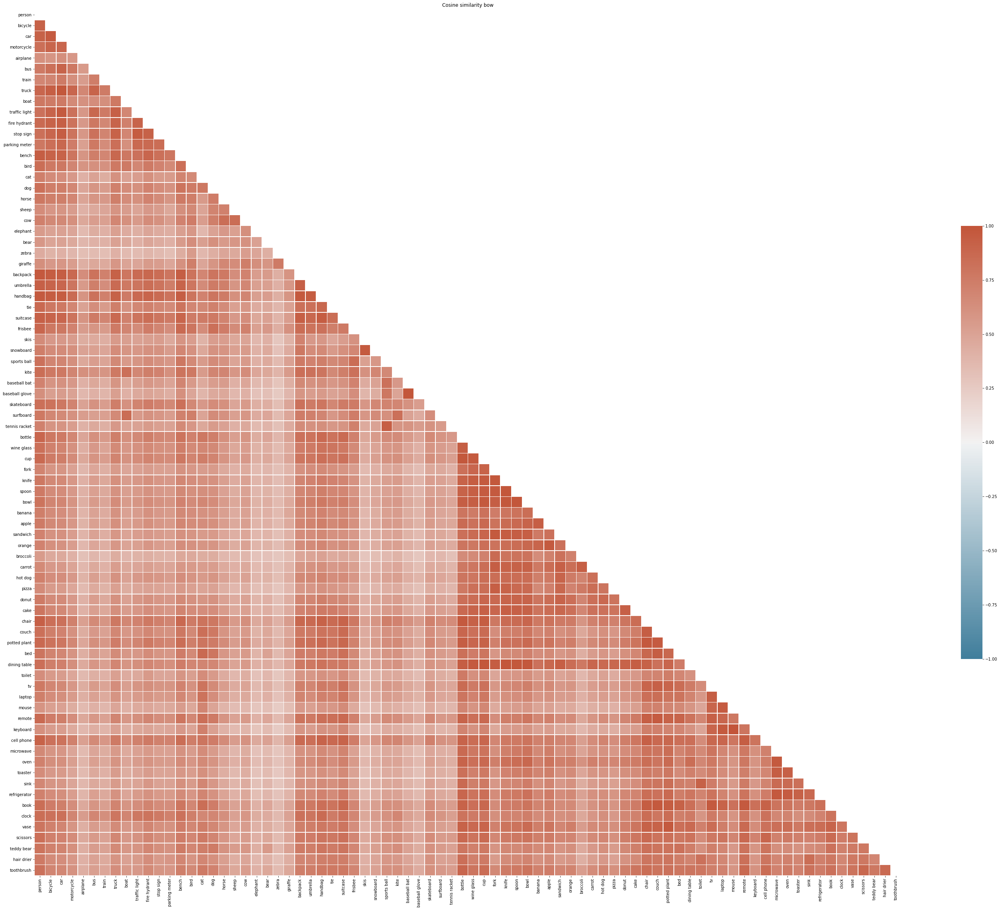

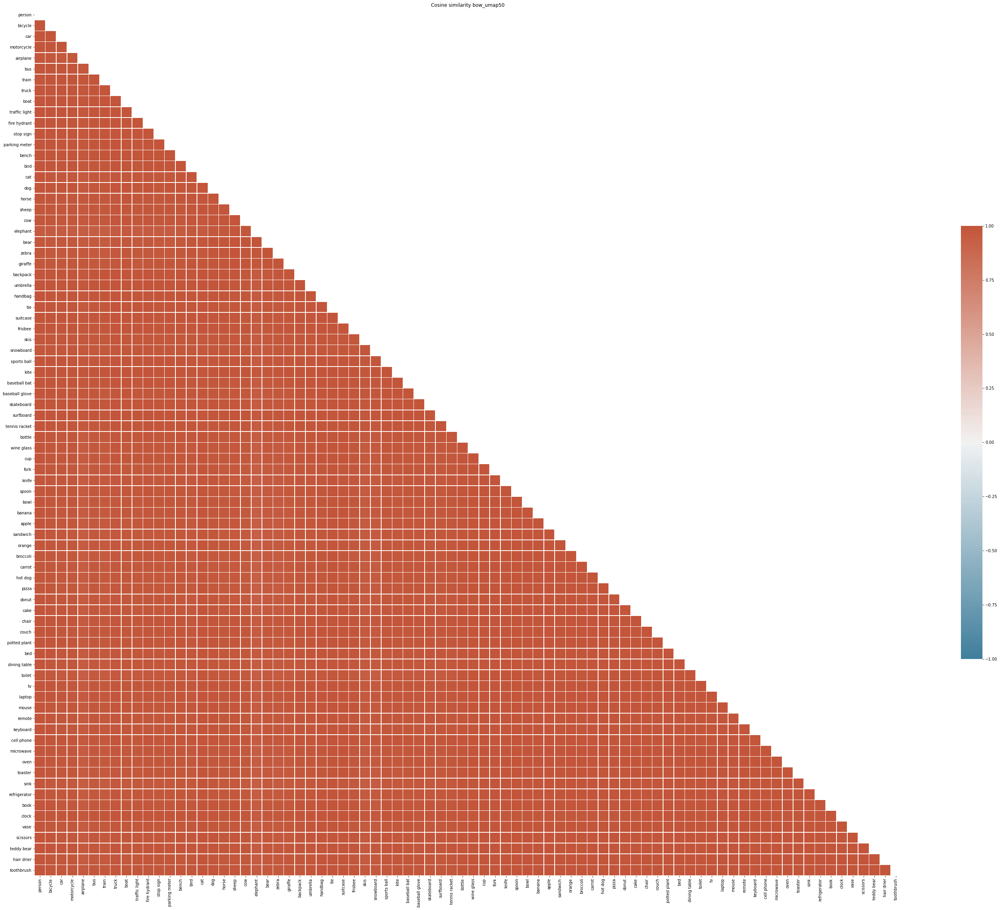

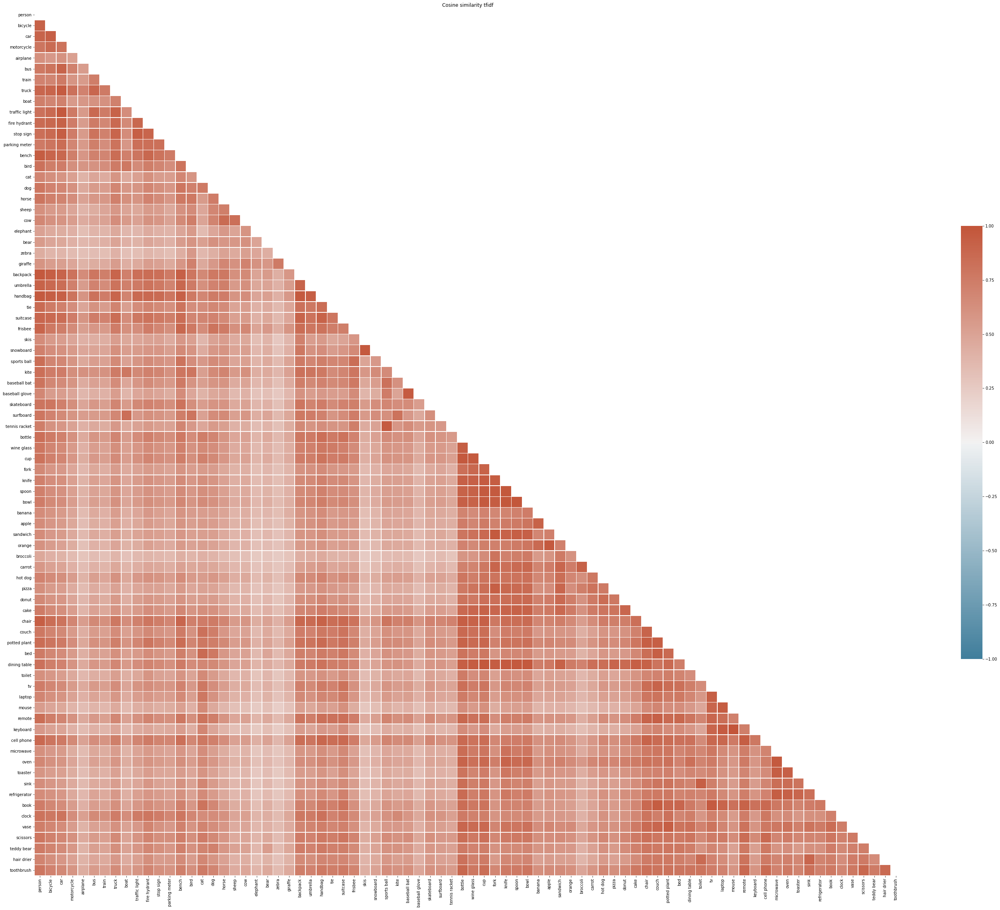

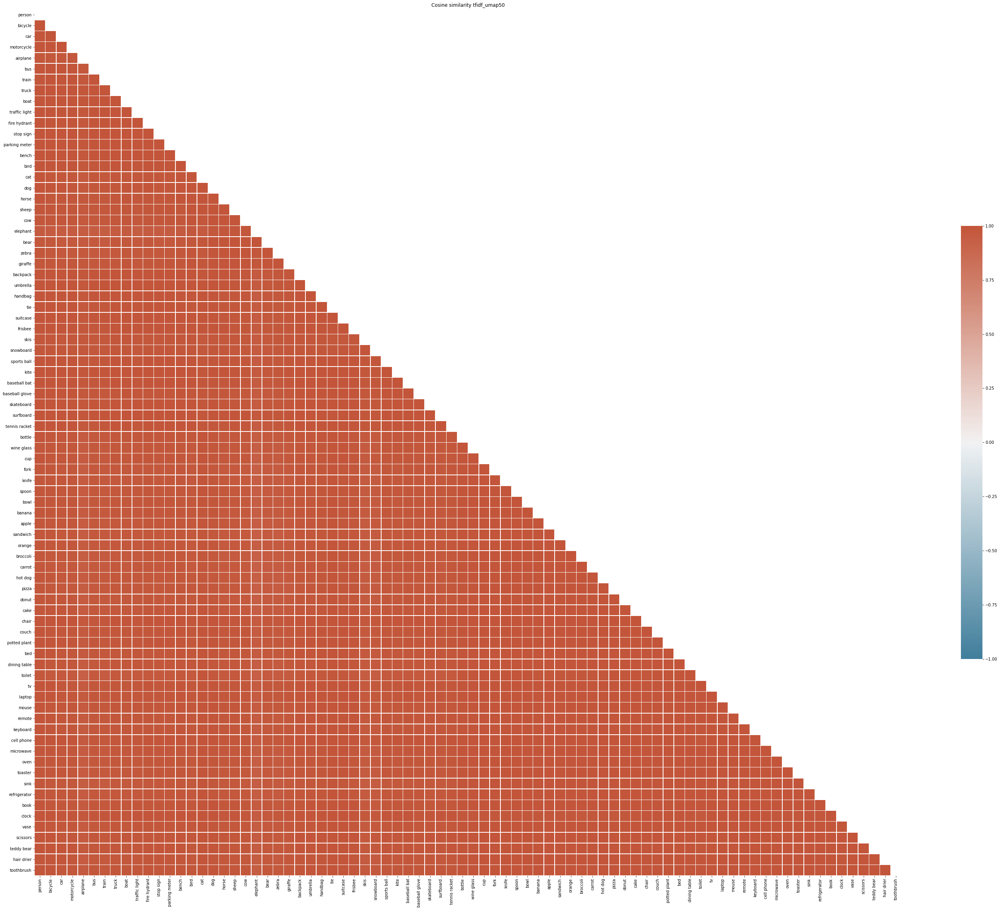

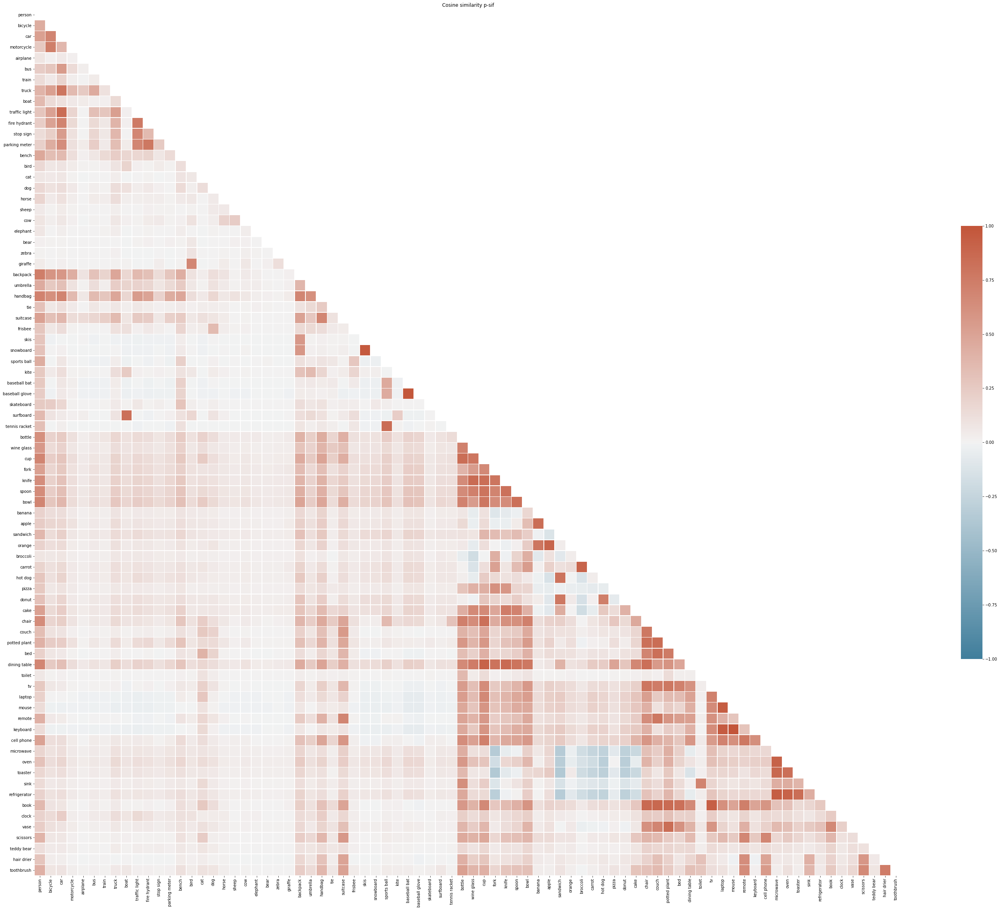

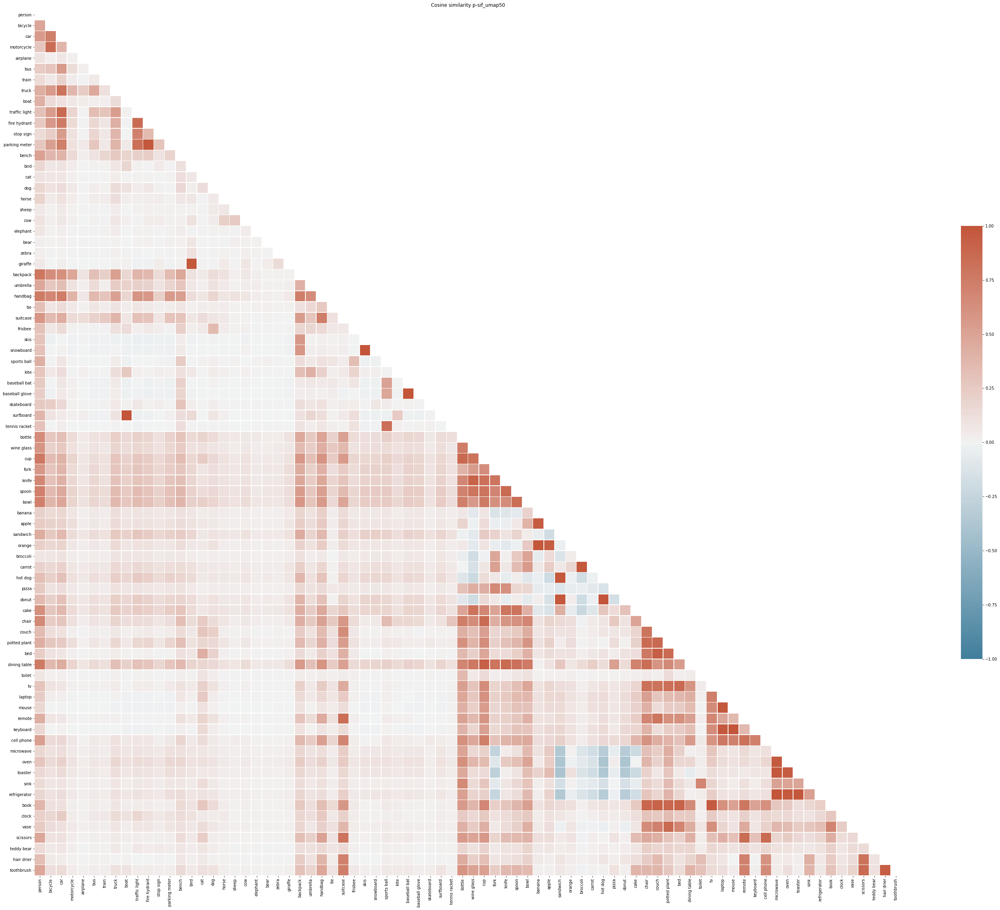

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

for name, X_docs in averaged_docs_dict.items():
    csim = cosine_similarity(X_docs, X_docs)
    plot_corr_matrix_heatmap(csim, category_names)
    plt.title(f'Cosine similarity {name}')
    plt.show()

In [ ]:
def extract_lower_triangle(A):
    indices = np.tril_indices_from(A)
    return np.asarray(A[indices])

average_similarities = []

for name, X_docs in averaged_docs_dict.items():

    for supercategory in supercategory_names:
        supercategory_mask = np.array(supercategory_doc_labels) == supercategory
        csim = cosine_similarity(X_docs, X_docs)
        within_mean_sim = extract_lower_triangle(csim[supercategory_mask][:, supercategory_mask]).mean()

        without_mean_sim = extract_lower_triangle(csim[supercategory_mask][:, ~supercategory_mask]).mean()
        average_similarities.append(
            {'method': name, 
             'supercategory': supercategory, 
             'within': within_mean_sim,
             'without': without_mean_sim}) 

average_similarities=pd.DataFrame(average_similarities)
average_similarities['ratio'] = average_similarities['within']/average_similarities['without']

Text(0.5, 1.0, 'ratio of within/without mean cosine similarity')

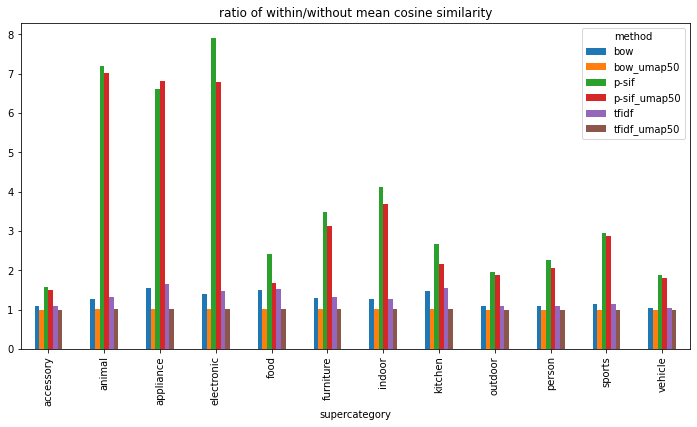

In [ ]:
average_similarities.pivot('supercategory', 'method', 'ratio').plot.bar(figsize=(12,6))
plt.title('ratio of within/without mean cosine similarity')

Text(0.5, 1.0, 'total ratio of within/without mean cosine similarity')

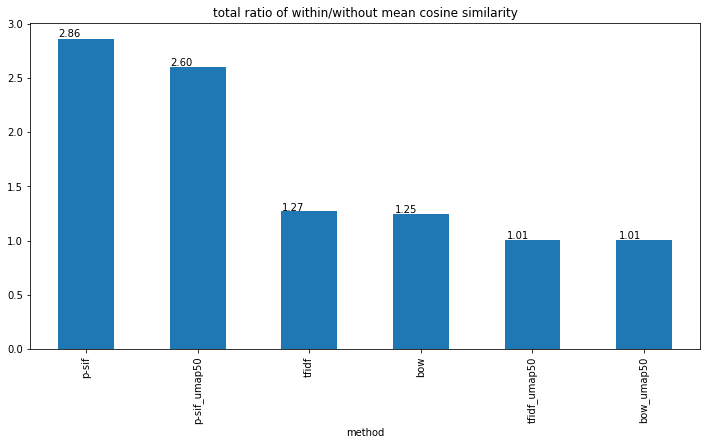

In [ ]:
ax=average_similarities.groupby('method').apply(lambda x: x['within'].sum() / x['without'].sum()).sort_values(ascending=False).plot.bar(figsize=(12,6))
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', (p.get_x() * 1.005, p.get_height() * 1.005))

plt.title('total ratio of within/without mean cosine similarity')

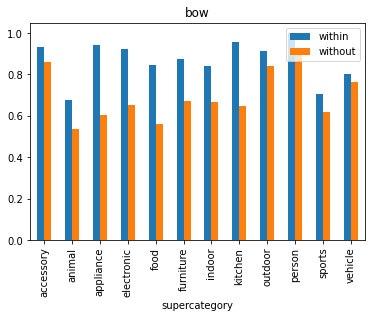

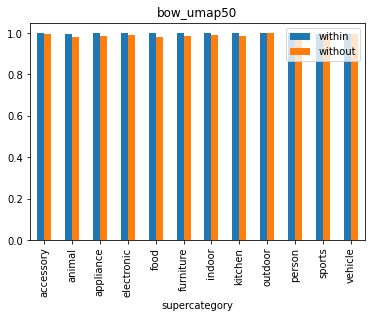

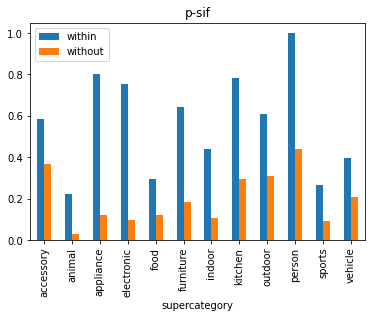

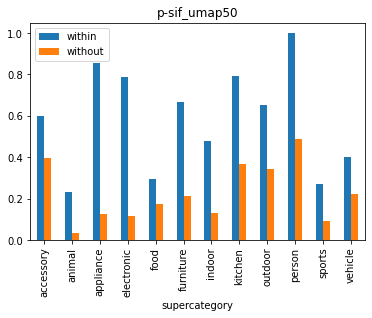

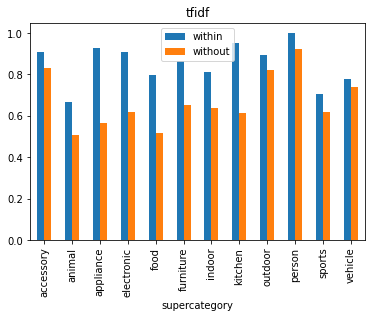

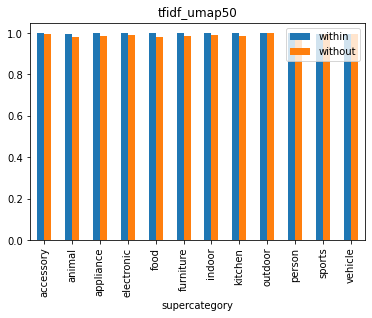

In [ ]:
axarr = average_similarities.set_index('supercategory').sort_index().groupby('method')[['within', 'without']].plot.bar()

for name, ax in axarr.items():
    ax.set_title(name)

As we can see, when the documents originates from words belonging to multiple topics, which is the case of the COCO multi-label annotations, their corresponding embedding averaging technique don't work very well. The P-SIF technique re-adapated using UMAP + GMM, instead of the k-SVD model proposed in the original paper, allow us to re-arrange the data into manifolds representing topics and to preserve the information of each word locally in the topic's manifold. Thus, this methology allows to average document embeddings without losing their multiple topicality.

Another observation worth to note is that the UMAP-reduced feature space lose its linearity, thus averaging without topic partitioning would produce meaningless vectors.